## 导入所需要的包

### 数据分析包

In [1]:
import numpy as np 
import pandas as pd 
from scipy import stats

e:\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### 绘图工具包

In [2]:
# 显示全部dataframe
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = ['SimHei'] # 设置字体，中文显示
plt.rcParams['axes.unicode_minus'] = False   # 坐标轴负数的负号显示
import seaborn as sns
from IPython.display import display
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import graphviz

### 特征选择+数据预处理+机器学习模型

In [3]:
import eli5
from eli5.sklearn import PermutationImportance
import shap
import missingno as msno
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss, ccf
import category_encoders as ce
from lightgbm import LGBMRegressor,plot_importance,plot_metric,plot_tree
from xgboost import XGBRegressor
import statsmodels.api as sm
from sklearn.ensemble import GradientBoostingRegressor,RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import (MinMaxScaler,OneHotEncoder,
                                   RobustScaler,LabelEncoder)

from sklearn.model_selection import (train_test_split,cross_val_score,
                                     GridSearchCV,KFold,learning_curve,
                                     cross_validate,RandomizedSearchCV,
                                    TimeSeriesSplit)

from feature_engine.encoding import (MeanEncoder,CountFrequencyEncoder,
                                    OneHotEncoder,OrdinalEncoder)

from sklearn.feature_selection import f_classif,chi2,SelectKBest,VarianceThreshold
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.feature_selection import mutual_info_classif as MIC 
from sklearn.decomposition import PCA
from scipy.stats import boxcox 
from scipy.special import inv_boxcox 

from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
import lightgbm as lgb
from eli5.sklearn import PermutationImportance
from lightgbm.plotting import create_tree_digraph,plot_split_value_histogram
import shap
import os
from warnings import filterwarnings
filterwarnings("ignore")

### 导入数据并查看dataframe结构

In [4]:
energy_df=pd.read_csv("energy_dataset.csv")
weather_df=pd.read_csv("weather_features.csv")

In [5]:
weather_df #天气数据17个字段

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
1,2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2,2015-01-01 02:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
3,2015-01-01 03:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
4,2015-01-01 04:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178391,2018-12-31 19:00:00+01:00,Seville,287.760,287.150,288.150,1028,54,3,30,0.0,0.0,0.0,0,800,clear,sky is clear,01n
178392,2018-12-31 20:00:00+01:00,Seville,285.760,285.150,286.150,1029,62,3,30,0.0,0.0,0.0,0,800,clear,sky is clear,01n
178393,2018-12-31 21:00:00+01:00,Seville,285.150,285.150,285.150,1028,58,4,50,0.0,0.0,0.0,0,800,clear,sky is clear,01n
178394,2018-12-31 22:00:00+01:00,Seville,284.150,284.150,284.150,1029,57,4,60,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [6]:
energy_df #发电价格相关数据 29个字段

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage aggregated,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation marine,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,NaN,863.0,1051.0,1899.0,0.0,7096.0,43.0,73.0,49.0,196.0,0.0,6378.0,17,NaN,6436,26118,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,NaN,920.0,1009.0,1658.0,0.0,7096.0,43.0,71.0,50.0,195.0,0.0,5890.0,16,NaN,5856,24934,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,NaN,1164.0,973.0,1371.0,0.0,7099.0,43.0,73.0,50.0,196.0,0.0,5461.0,8,NaN,5454,23515,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,NaN,1503.0,949.0,779.0,0.0,7098.0,43.0,75.0,50.0,191.0,0.0,5238.0,2,NaN,5151,22642,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,NaN,1826.0,953.0,720.0,0.0,7097.0,43.0,74.0,42.0,189.0,0.0,4935.0,9,NaN,4861,21785,20264.0,38.41,56.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,2018-12-31 19:00:00+01:00,297.0,0.0,0.0,7634.0,2628.0,178.0,0.0,0.0,0.0,NaN,1.0,1135.0,4836.0,0.0,6073.0,63.0,95.0,85.0,277.0,0.0,3113.0,96,NaN,3253,30619,30653.0,68.85,77.02
35060,2018-12-31 20:00:00+01:00,296.0,0.0,0.0,7241.0,2566.0,174.0,0.0,0.0,0.0,NaN,1.0,1172.0,3931.0,0.0,6074.0,62.0,95.0,33.0,280.0,0.0,3288.0,51,NaN,3353,29932,29735.0,68.40,76.16
35061,2018-12-31 21:00:00+01:00,292.0,0.0,0.0,7025.0,2422.0,168.0,0.0,0.0,0.0,NaN,50.0,1148.0,2831.0,0.0,6076.0,61.0,94.0,31.0,286.0,0.0,3503.0,36,NaN,3404,27903,28071.0,66.88,74.30
35062,2018-12-31 22:00:00+01:00,293.0,0.0,0.0,6562.0,2293.0,163.0,0.0,0.0,0.0,NaN,108.0,1128.0,2068.0,0.0,6075.0,61.0,93.0,31.0,287.0,0.0,3586.0,29,NaN,3273,25450,25801.0,63.93,69.89


In [7]:
print(weather_df.shape,energy_df.shape)

(178396, 17) (35064, 29)


西班牙五座城市的天气数据条目数。马德里最多，瓦伦西亚最少，但是差别不大。

In [8]:
weather_df.city_name.value_counts()

Madrid        36267
Bilbao        35951
Seville       35557
 Barcelona    35476
Valencia      35145
Name: city_name, dtype: int64

In [9]:
print('电能价格数据日期范围：',energy_df.time.min(),energy_df.time.max())
print('天气情况数据日期范围',weather_df.dt_iso.min(),weather_df.dt_iso.max())

电能价格数据日期范围： 2015-01-01 00:00:00+01:00 2018-12-31 23:00:00+01:00
天气情况数据日期范围 2015-01-01 00:00:00+01:00 2018-12-31 23:00:00+01:00


### 查看数据的缺失值情况、零值情况并且进行处理

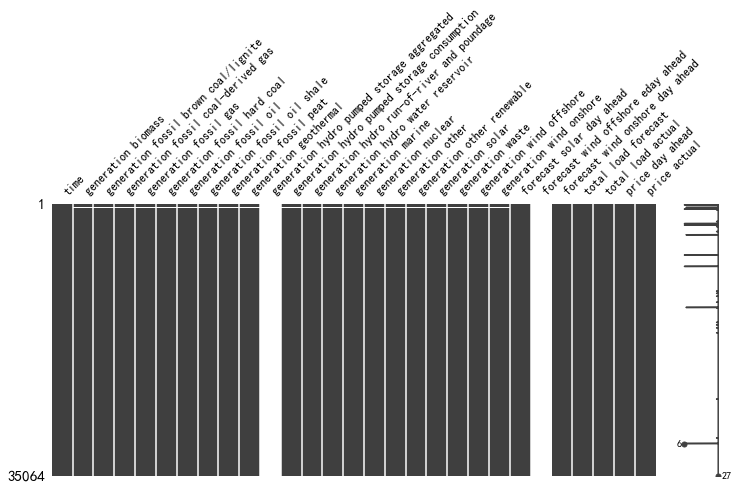

In [10]:
#调出未缺失值相关矩阵
msno.matrix(df=energy_df,figsize=(12,5),fontsize=12);

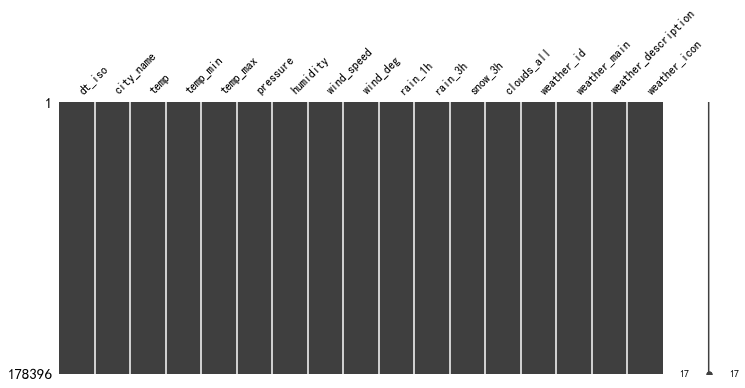

In [11]:
msno.matrix(df=weather_df,figsize=(12,5),fontsize=12);

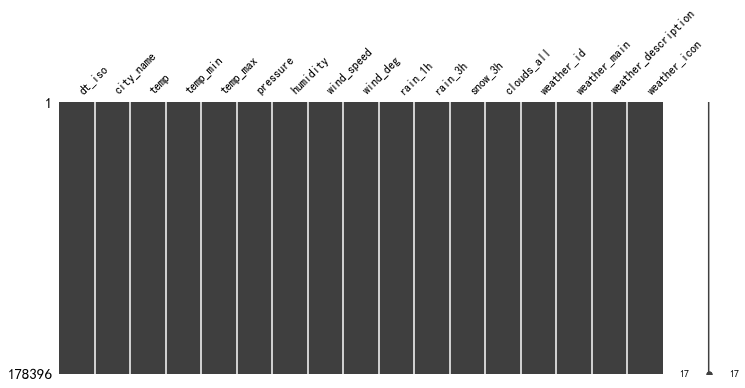

In [12]:
msno.matrix(df=weather_df,figsize=(12,5),fontsize=12);

In [13]:
#定义一个归纳汇总DataFrame缺失值的函数
def miss_frame(data):
    frame=pd.DataFrame()
    frame["missing_num"]=data.isnull().sum()
    frame["missing_rate"]=data.isnull().sum()/len(data)
    frame=frame.loc[frame["missing_rate"]>0].sort_values(by="missing_rate",
                                                         ascending=False)
    frame["missing_rate>0.05"]=frame["missing_rate"].map(lambda x:1 if x>=0.05 else 0)
    return frame

miss_frame(energy_df)

,missing_num,missing_rate,missing_rate>0.05
generation hydro pumped storage aggregated,35064,1.000000,1
forecast wind offshore eday ahead,35064,1.000000,1
total load actual,36,0.001027,0
generation waste,19,0.000542,0
generation marine,19,0.000542,0
generation hydro pumped storage consumption,19,0.000542,0
generation biomass,19,0.000542,0
generation fossil oil,19,0.000542,0
generation hydro run-of-river and poundage,19,0.000542,0
generation fossil peat,18,0.000513,0


In [14]:
miss_frame(weather_df)

,missing_num,missing_rate,missing_rate>0.05


#### 诊断分析相关函数

In [15]:
def diagnostic_plots(df, variable):
    ''' 
    该函数用于诊断分析。主要分三部分：柱状密度图、QQ图以及箱线图
    :param df: 需要诊断分析的数据
    :param variable: 需要诊断分析的数据字段名
    '''
    plt.figure(figsize=(17, 5))

    plt.subplot(1, 3, 1)
    sns.distplot(df[variable])
    plt.title('Histogram')
    
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('RM quantiles')

    plt.subplot(1, 3, 3)
    sns.boxplot(x=df[variable])
    plt.title('Boxplot')
    
    plt.show()

#### 绘制时间序列函数

In [16]:
def plot_timeseries(df=None, column=None, series=pd.Series([]), 
                label=None, ylabel=None, title=None, start=0, end=None):
    """
    绘制已加载到数据帧中的特定时间序列
    可以定义“df”和“column”或“series”，此外，还可以定义“label”、“ylabel”、“title”、“start”和“end”。
    """
    sns.set()
    fig, ax = plt.subplots(figsize=(30, 12))
    ax.set_xlabel('Time', fontsize=16)
    if column:
        ax.plot(df[column][start:end], label=label)
        ax.set_ylabel(ylabel, fontsize=16)
    if series.any():
        ax.plot(series, label=label)
        ax.set_ylabel(ylabel, fontsize=16)
    if label:
        ax.legend(fontsize=16)
    if title:
        ax.set_title(title, fontsize=24)
    ax.grid(True)
    return ax

#### 查看天气数据的统计量情况

In [17]:
energy_zero=energy_df.eq(0).sum().to_frame(name="Zero Values Counts")
energy_zero[energy_zero.loc[:,'Zero Values Counts']>10000]

,Zero Values Counts
generation fossil brown coal/lignite,10517
generation fossil coal-derived gas,35046
generation fossil oil shale,35046
generation fossil peat,35046
generation geothermal,35046
generation hydro pumped storage consumption,12607
generation marine,35045
generation wind offshore,35046


In [18]:
energy_zero

,Zero Values Counts
time,0
generation biomass,4
generation fossil brown coal/lignite,10517
generation fossil coal-derived gas,35046
generation fossil gas,1
generation fossil hard coal,3
generation fossil oil,3
generation fossil oil shale,35046
generation fossil peat,35046
generation geothermal,35046


In [19]:
#去掉一些缺失值过多的特征
energy_df.drop(["generation fossil coal-derived gas",
                  "generation fossil oil shale",
                  "generation fossil peat",
                  "generation geothermal",
                  "generation marine",
                  "generation wind offshore",
                  "generation hydro pumped storage aggregated",
                    "forecast wind offshore eday ahead"],
                 axis=1,
                 inplace=True)

In [20]:
miss_frame(energy_df)


,missing_num,missing_rate,missing_rate>0.05
total load actual,36,0.001027,0
generation biomass,19,0.000542,0
generation fossil oil,19,0.000542,0
generation hydro pumped storage consumption,19,0.000542,0
generation hydro run-of-river and poundage,19,0.000542,0
generation waste,19,0.000542,0
generation fossil brown coal/lignite,18,0.000513,0
generation fossil gas,18,0.000513,0
generation fossil hard coal,18,0.000513,0
generation hydro water reservoir,18,0.000513,0


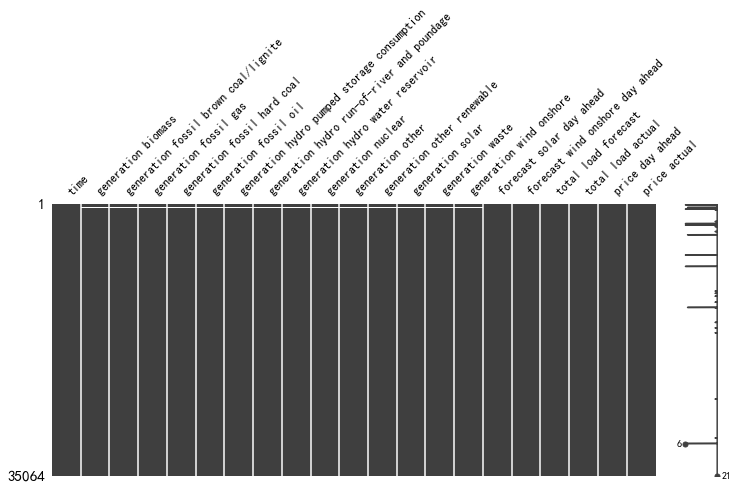

In [21]:
msno.matrix(df=energy_df,figsize=(12,5),fontsize=12);

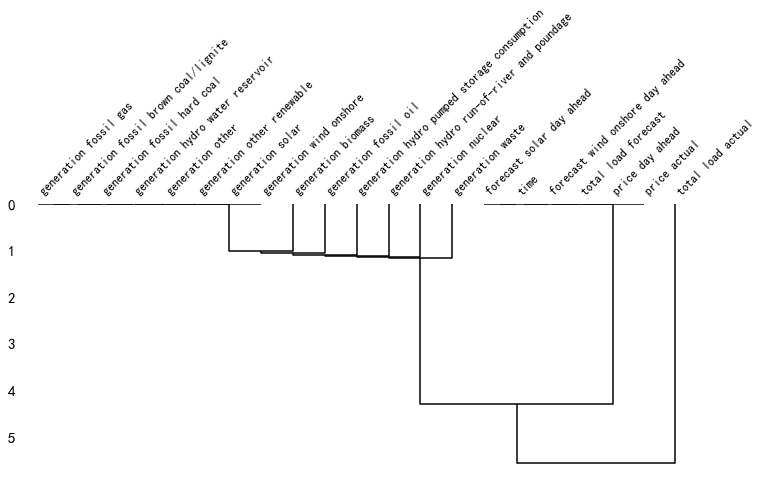

In [21]:
msno.dendrogram(df=energy_df,figsize=(12,5),fontsize=12);

#### 查看此时能源数据的缺失值与重复值情况

In [22]:
print('能源数据有{}个数据缺失值或未知值'
      .format(energy_df.isnull().values.sum()))

temp_energy = energy_df.duplicated(keep='first').sum()

print('有{}个数据重复值'
      .format(temp_energy))

能源数据有292个数据缺失值或未知值
有0个数据重复值


In [23]:
print('天气数据有{}个数据缺失值或未知值'
      .format(weather_df.isnull().values.sum()))

temp_weather = weather_df.duplicated(keep='first').sum()

print('有{}个数据重复值'
      .format(temp_weather))

天气数据有0个数据缺失值或未知值
有21个数据重复值


In [24]:
print('对于能源数据有{}个样本。'.format(energy_df.shape[0]))

cities = weather_df['city_name'].unique()
grouped_weather = weather_df.groupby('city_name')

for city in cities:
    print('对于天气数据的样本数为{}'
          .format(grouped_weather.get_group('{}'.format(city)).shape[0]), 
          '对应城市为{}.'.format(city))

对于能源数据有35064个样本。
对于天气数据的样本数为35145 对应城市为Valencia.
对于天气数据的样本数为36267 对应城市为Madrid.
对于天气数据的样本数为35951 对应城市为Bilbao.
对于天气数据的样本数为35476 对应城市为 Barcelona.
对于天气数据的样本数为35557 对应城市为Seville.


#### 处理能源数据中的剩余缺失值

In [25]:
missing_energy=energy_df[energy_df.isna().any(axis=1)]
missing_energy.head()
#将缺失数据的特征列名与索引单拎出来
miss_cols=miss_frame(missing_energy).index.to_list()
miss_index=missing_energy.index.to_list()

energy_new=energy_df.copy()

#采用线性插值方法进行缺失值的填补
energy_new[miss_cols]=energy_new[miss_cols].interpolate(method='linear', limit_direction='forward', axis=0)
energy_new.iloc[miss_index].head()

energy_time = energy_df.set_index('time')

In [26]:
print('总数据有{}个数据缺失值或未知值'
      .format(energy_new.isnull().values.sum()))

temp_energy = energy_new.duplicated(keep='first').sum()

print('有{}个数据重复值'
      .format(temp_energy))

总数据有0个数据缺失值或未知值
有0个数据重复值


#### 处理天气当中的异常值

In [27]:
weather_df.describe().round(2)

,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id
count,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00
mean,289.62,288.33,291.09,1069.26,68.42,2.47,166.59,0.08,0.00,0.00,25.07,759.83
std,8.03,7.96,8.61,5969.63,21.90,2.10,116.61,0.40,0.01,0.22,30.77,108.73
min,262.24,262.24,262.24,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,200.00
25%,283.67,282.48,284.65,1013.00,53.00,1.00,55.00,0.00,0.00,0.00,0.00,800.00
50%,289.15,288.15,290.15,1018.00,72.00,2.00,177.00,0.00,0.00,0.00,20.00,800.00
75%,295.15,293.73,297.15,1022.00,87.00,4.00,270.00,0.00,0.00,0.00,40.00,801.00
max,315.60,315.15,321.15,1008371.00,100.00,133.00,360.00,12.00,2.32,21.50,100.00,804.00


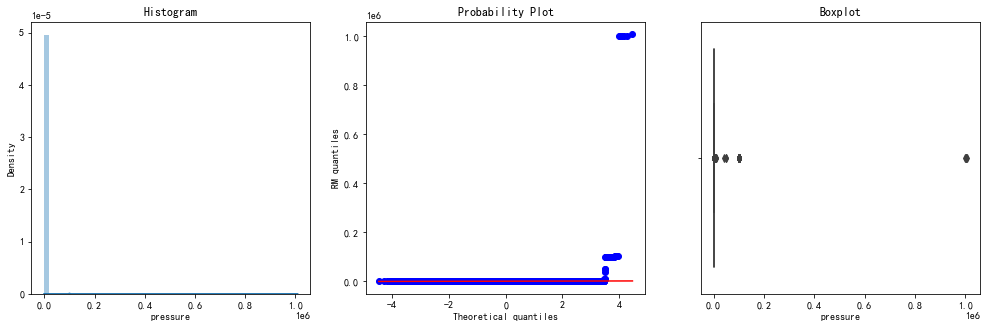

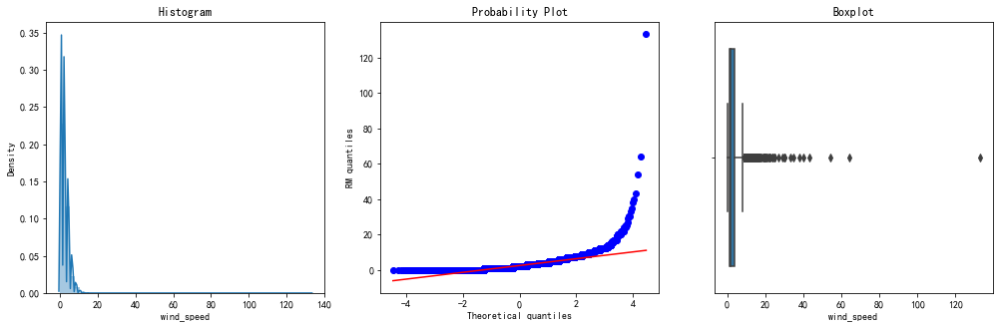

In [28]:
diagnostic_plots(weather_df,'pressure')  #发现气压的异常值
diagnostic_plots(weather_df,'wind_speed')  #发现风速的异常值

In [29]:
#气压大于1050或气压小于930都不太正常，故直接替换为nan，后续采用插值方法填补数据
weather_df.loc[weather_df.pressure > 1050, 'pressure'] = np.nan
weather_df.loc[weather_df.pressure < 930, 'pressure'] = np.nan
#风速大于30也不太合理，因此也替换为nan，后续采用插值方法填补数据
weather_df.loc[weather_df.wind_speed > 30, 'wind_speed'] = np.nan

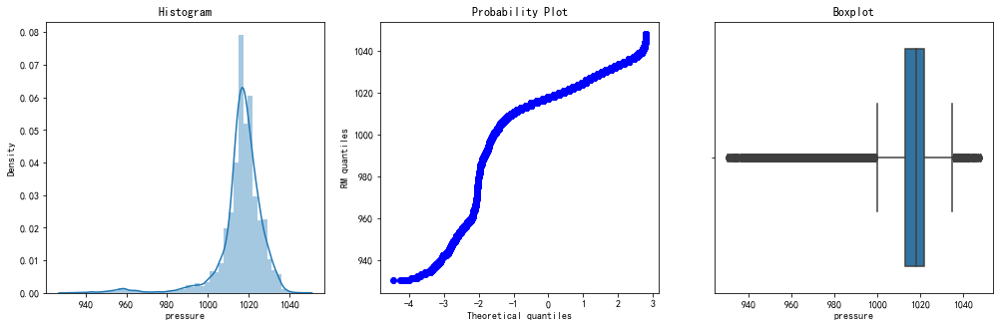

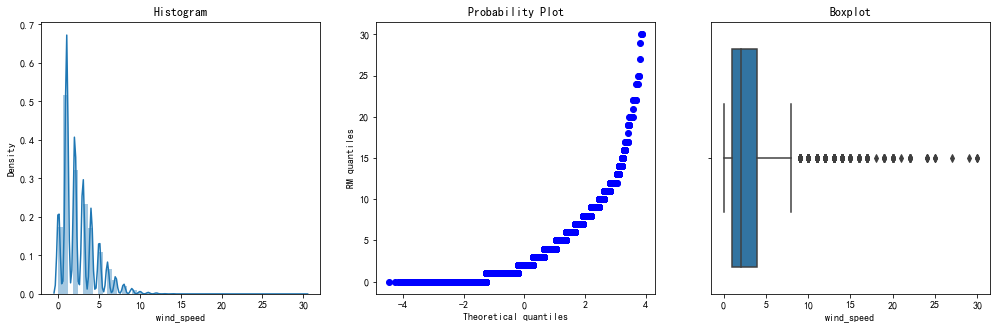

In [30]:
#处理完后看一下诊断分析结果
diagnostic_plots(weather_df,'pressure') 
diagnostic_plots(weather_df,'wind_speed')

In [31]:
#用线性插值方法重新填补
weather_df.interpolate(method='linear', limit_direction='forward', inplace=True, axis=0)

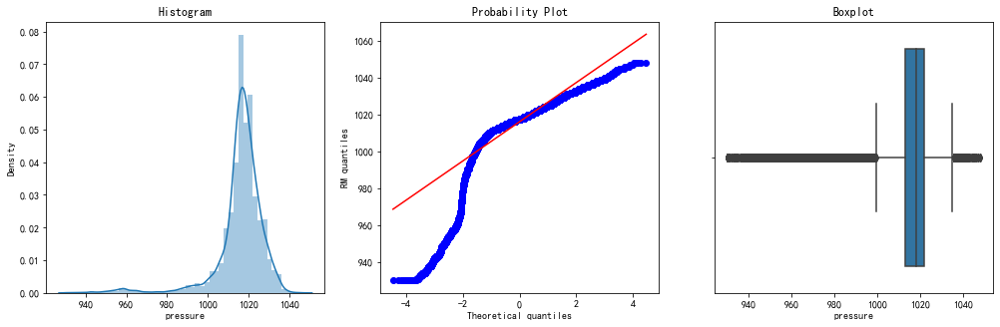

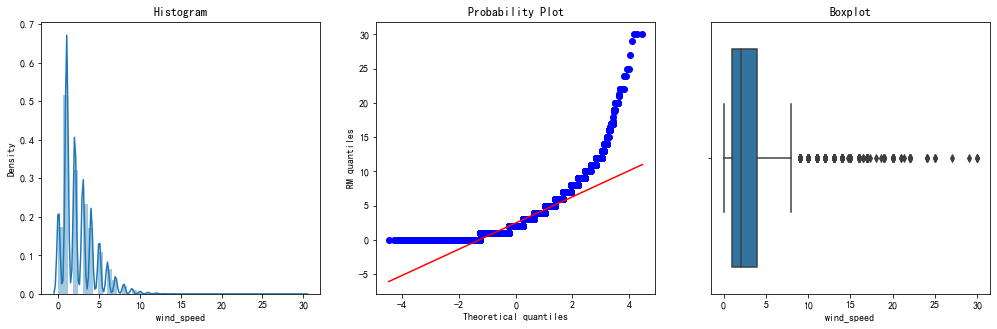

In [32]:
#处理完后看一下诊断分析结果。此时结果稍许正常
diagnostic_plots(weather_df,'pressure') 
diagnostic_plots(weather_df,'wind_speed')

查看各个城市的天气数据条目数情况，尽可能做到条目数与能源价格条目数匹配

In [33]:
weather_bar=weather_df.query("city_name == ' Barcelona'")
weather_bil=weather_df.query("city_name == 'Bilbao'")
weather_mad=weather_df.query("city_name == 'Madrid'")
weather_sev=weather_df.query("city_name == 'Seville'")
weather_val=weather_df.query("city_name == 'Valencia'")
#打印数据维度，发现条目数并不匹配
print(weather_bar.shape,energy_df.shape)
print(weather_bil.shape,energy_df.shape)
print(weather_mad.shape,energy_df.shape)
print(weather_sev.shape,energy_df.shape)
print(weather_val.shape,energy_df.shape)

(35476, 17) (35064, 21)
(35951, 17) (35064, 21)
(36267, 17) (35064, 21)
(35557, 17) (35064, 21)
(35145, 17) (35064, 21)


#### 将原来字段中的时间字段改名

In [34]:
weather_df=weather_df.rename({"dt_iso":"time"},axis=1)
weather_bar=weather_bar.rename({"dt_iso":"time"},axis=1)
weather_bil=weather_bil.rename({"dt_iso":"time"},axis=1)
weather_mad=weather_mad.rename({"dt_iso":"time"},axis=1)
weather_sev=weather_sev.rename({"dt_iso":"time"},axis=1)
weather_val=weather_val.rename({"dt_iso":"time"},axis=1)

发现城市天气数据的条目数基本上多于能源价格条目数。故需要进一步处理使他们在条目数上匹配

In [35]:
weather_bar=weather_bar.drop_duplicates(subset="time",keep="first")
weather_bil=weather_bil.drop_duplicates(subset="time",keep="first")
weather_mad=weather_mad.drop_duplicates(subset="time",keep="first")
weather_sev=weather_sev.drop_duplicates(subset="time",keep="first")
weather_val=weather_val.drop_duplicates(subset="time",keep="first")  #发现不同城市的气温数据中存在重复时间值，故需要删去重复值

#删去重复值后打印一下，观察结果
print(weather_bar.shape,energy_df.shape)
print(weather_bil.shape,energy_df.shape)
print(weather_mad.shape,energy_df.shape)
print(weather_sev.shape,energy_df.shape)
print(weather_val.shape,energy_df.shape)

(35064, 17) (35064, 21)
(35064, 17) (35064, 21)
(35064, 17) (35064, 21)
(35064, 17) (35064, 21)
(35064, 17) (35064, 21)


In [36]:
weather_bar

,time,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
107363,2015-01-01 00:00:00+01:00,Barcelona,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0.0,0.0,0,800,clear,sky is clear,01n
107364,2015-01-01 01:00:00+01:00,Barcelona,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0.0,0.0,0,800,clear,sky is clear,01n
107365,2015-01-01 02:00:00+01:00,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0.0,0.0,0,800,clear,sky is clear,01n
107366,2015-01-01 03:00:00+01:00,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0.0,0.0,0,800,clear,sky is clear,01n
107367,2015-01-01 04:00:00+01:00,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0.0,0.0,0,800,clear,sky is clear,01n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142834,2018-12-31 19:00:00+01:00,Barcelona,284.130,282.150,286.150,1027.0,71,1.0,250,0.0,0.0,0.0,0,800,clear,sky is clear,01n
142835,2018-12-31 20:00:00+01:00,Barcelona,282.640,281.150,284.150,1027.0,62,3.0,270,0.0,0.0,0.0,0,800,clear,sky is clear,01n
142836,2018-12-31 21:00:00+01:00,Barcelona,282.140,280.150,284.150,1028.0,53,4.0,300,0.0,0.0,0.0,0,800,clear,sky is clear,01n
142837,2018-12-31 22:00:00+01:00,Barcelona,281.130,278.150,284.150,1028.0,50,5.0,320,0.0,0.0,0.0,0,800,clear,sky is clear,01n


#### 处理能源数据集当中的缺失值

#### 合并各城市的每小时天气数据与能源价格数据

##### 用于单独的每个城市分析，表达城市对于电价的贡献度

In [37]:
bar_df=pd.merge(energy_new,weather_bar,on="time")
bil_df=pd.merge(energy_new,weather_bil,on="time")
mad_df=pd.merge(energy_new,weather_mad,on="time")
sev_df=pd.merge(energy_new,weather_sev,on="time")
val_df=pd.merge(energy_new,weather_val,on="time")
#打印一下维度结果
print(bar_df.shape,bil_df.shape,mad_df.shape,sev_df.shape,val_df.shape)

(35064, 37) (35064, 37) (35064, 37) (35064, 37) (35064, 37)


In [38]:
#重构时间特征，将一列时间特征变为索引，另一列作为后续提取更为细化的时间特征的依据。
bar_df['pd_time'] = bar_df['time']
bar_df['pd_time'] = pd.to_datetime(bar_df['pd_time'], utc=True, infer_datetime_format=True)
bar_df = bar_df.set_index('pd_time')

bil_df['pd_time'] = bil_df['time']
bil_df['pd_time'] = pd.to_datetime(bil_df['pd_time'], utc=True, infer_datetime_format=True)
bil_df = bil_df.set_index('pd_time')

mad_df['pd_time'] = mad_df['time']
mad_df['pd_time'] = pd.to_datetime(mad_df['pd_time'], utc=True, infer_datetime_format=True)
mad_df = mad_df.set_index('pd_time')

sev_df['pd_time'] = sev_df['time']
sev_df['pd_time'] = pd.to_datetime(sev_df['pd_time'], utc=True, infer_datetime_format=True)
sev_df = sev_df.set_index('pd_time')

val_df['pd_time'] = val_df['time']
val_df['pd_time'] = pd.to_datetime(val_df['pd_time'], utc=True, infer_datetime_format=True)
val_df = val_df.set_index('pd_time')

In [39]:
weather_df_time = weather_df.set_index('time')
bar_df_time = bar_df.copy()
bil_df_time = bil_df.copy()
mad_df_time = mad_df.copy()
sev_df_time = sev_df.copy()
val_df_time = val_df.copy()
#更改索引为时间
bar_df_time['time'] = pd.to_datetime(bar_df_time['time'], utc=True, infer_datetime_format=True)
bar_df_time = bar_df_time.set_index('time')
bil_df_time['time'] = pd.to_datetime(bil_df_time['time'], utc=True, infer_datetime_format=True)
bil_df_time = bil_df_time.set_index('time')
mad_df_time['time'] = pd.to_datetime(mad_df_time['time'], utc=True, infer_datetime_format=True)
mad_df_time = mad_df_time.set_index('time')
sev_df_time['time'] = pd.to_datetime(sev_df_time['time'], utc=True, infer_datetime_format=True)
sev_df_time = sev_df_time.set_index('time')
val_df_time['time'] = pd.to_datetime(val_df_time['time'], utc=True, infer_datetime_format=True)
val_df_time = val_df_time.set_index('time')
weather_df_time

,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
time,,,,,,,,,,,,,,,,
2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001.0,77,1.0,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001.0,77,1.0,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 02:00:00+01:00,Valencia,269.686,269.686,269.686,1002.0,78,0.0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 03:00:00+01:00,Valencia,269.686,269.686,269.686,1002.0,78,0.0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 04:00:00+01:00,Valencia,269.686,269.686,269.686,1002.0,78,0.0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 19:00:00+01:00,Seville,287.760,287.150,288.150,1028.0,54,3.0,30,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2018-12-31 20:00:00+01:00,Seville,285.760,285.150,286.150,1029.0,62,3.0,30,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2018-12-31 21:00:00+01:00,Seville,285.150,285.150,285.150,1028.0,58,4.0,50,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [40]:
weather_df_time = weather_df_time.reset_index().drop_duplicates(subset=['time', 'city_name'],
                                                      keep='first').set_index('time')
weather_df_time = weather_df_time.drop(['weather_main', 'weather_id', 
                              'weather_description', 'weather_icon'], axis=1)

In [41]:
#对五座城市的数据进行整合
df_1, df_2, df_3, df_4, df_5 = [x for _, x in weather_df_time.groupby('city_name')]
dfs = [df_1, df_2, df_3, df_4, df_5]

total_df = energy_new

for df in dfs:
    city = df['city_name'].unique()
    city_str = str(city).replace("'", "").replace('[', '').replace(']', '').replace(' ', '')  #将无用字符去除
    df = df.add_suffix('_{}'.format(city_str))
    total_df = total_df.merge(df, on='time', how='outer')
    total_df = total_df.drop('city_name_{}'.format(city_str), axis=1)
    
total_df['time'] = pd.to_datetime(total_df['time'], utc=True, infer_datetime_format=True)
total_df = total_df.set_index('time')

#### 对于总体城市的数据分析

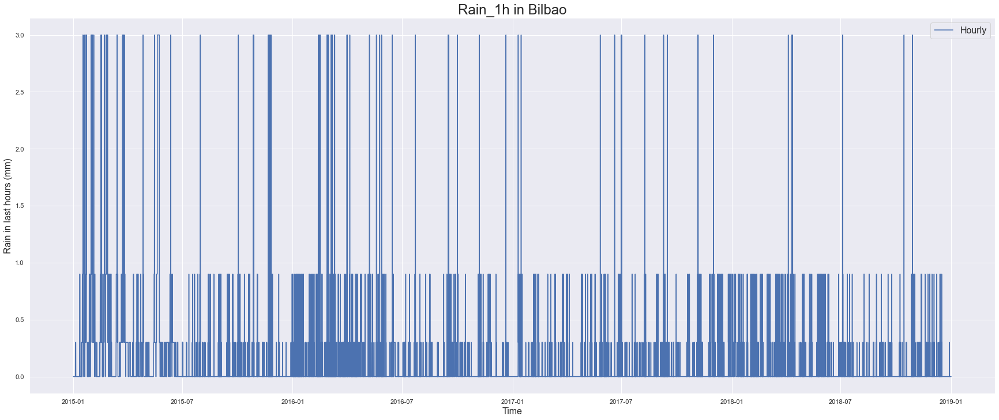

In [42]:
#绘制后1h降雨量trace
ax = plot_timeseries(bil_df, 'rain_1h', 
                 label='Hourly', ylabel='Rain in last hours (mm)',
                 title='Rain_1h in Bilbao')
plt.show()

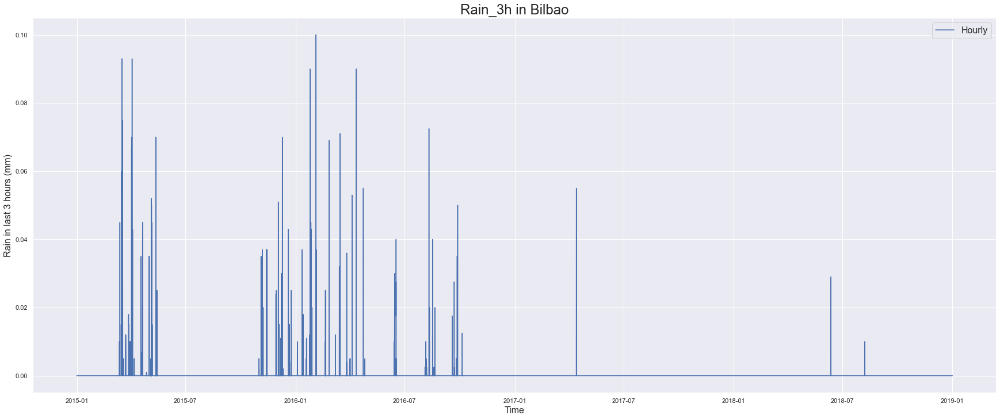

In [43]:
#绘制后3h降雨量trace.发现该数据并不可靠
ax = plot_timeseries(bar_df, 'rain_3h', 
                 label='Hourly', ylabel='Rain in last 3 hours (mm)',
                 title='Rain_3h in Bilbao')
plt.show()

In [44]:
# bar_df_time = bar_df_time.drop(['rain_3h'], axis=1)
# bil_df_time = bil_df_time.drop(['rain_3h'], axis=1)
# mad_df_time = mad_df_time.drop(['rain_3h'], axis=1)
# sev_df_time = sev_df_time.drop(['rain_3h'], axis=1)
# val_df_time = val_df_time.drop(['rain_3h'], axis=1)

bar_df = bar_df.drop(['rain_3h'], axis=1)
bil_df = bil_df.drop(['rain_3h'], axis=1)
mad_df = mad_df.drop(['rain_3h'], axis=1)
sev_df = sev_df.drop(['rain_3h'], axis=1)
val_df = val_df.drop(['rain_3h'], axis=1)

#### 构建滑动窗口，并且得到滞后一个星期内的电价均值。

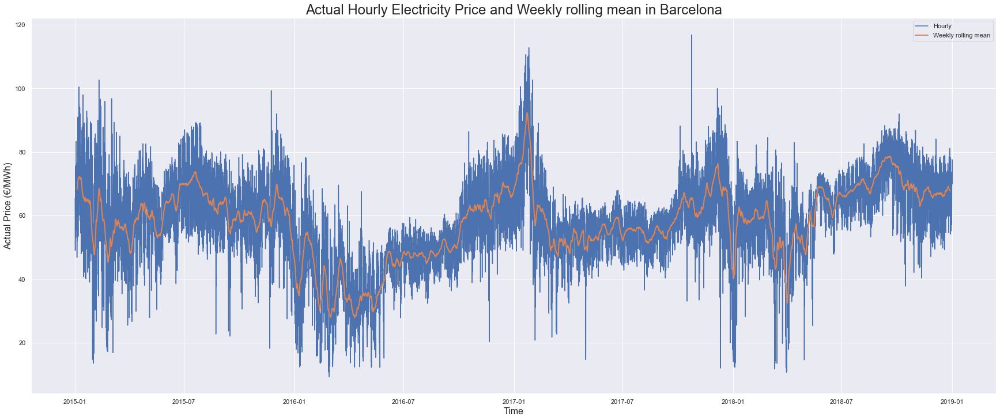

In [45]:

rolling = total_df['price actual'].rolling(24*7, center=True).mean()
ax = plot_timeseries(total_df, 'price actual', label='Hourly', ylabel='Actual Price (€/MWh)',
                 title='Actual Hourly Electricity Price and Weekly rolling mean in Barcelona')
ax.plot(rolling, linestyle='-', linewidth=2, label='Weekly rolling mean')
plt.legend()
plt.show()

#### 绘制任意两周内的电价变动情况

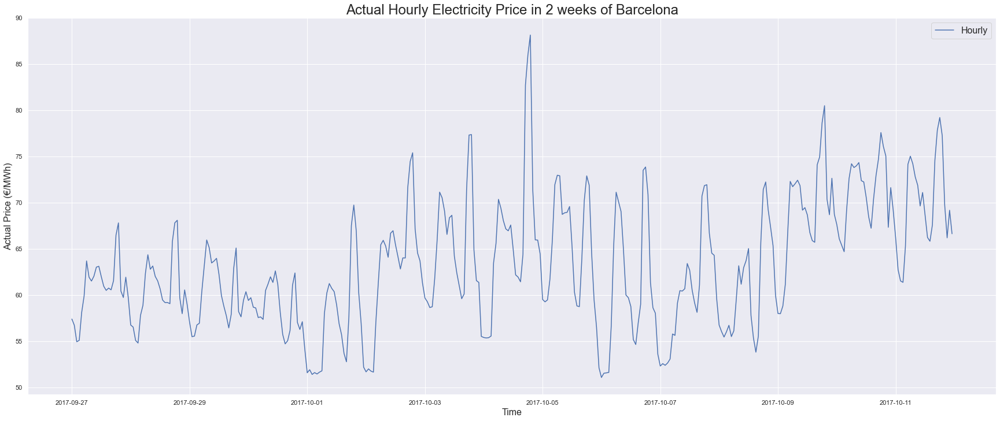

In [46]:

ax = plot_timeseries(bar_df_time, 'price actual', label='Hourly', ylabel='Actual Price (€/MWh)',
                 start=1 + 24 * 1000, end=1 + 24 * 1015,
                 title='Actual Hourly Electricity Price in 2 weeks of Barcelona')
plt.show()

#### 绘制电价的变动百分比变化

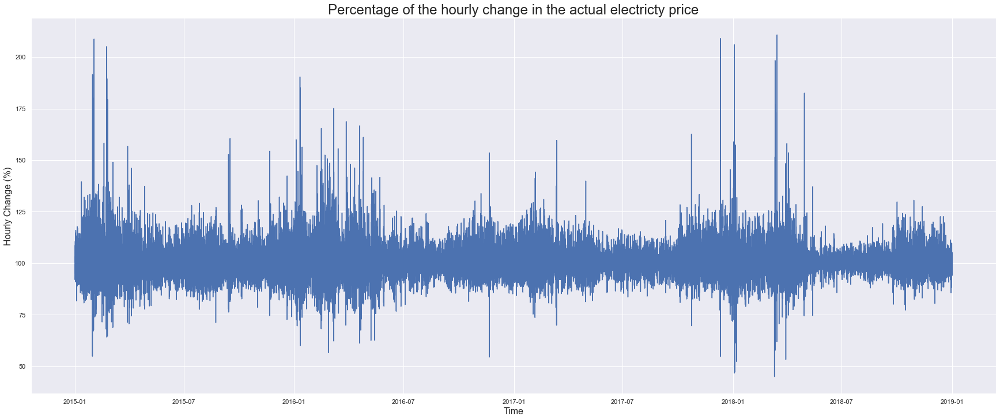

In [47]:
change = bar_df['price actual'].div(bar_df['price actual'].shift(1)).mul(100)
ax = plot_timeseries(series=change, ylabel='Hourly Change (%)', 
                 title='Percentage of the hourly change in the actual electricty price')
plt.show()

#### 时间序列分解

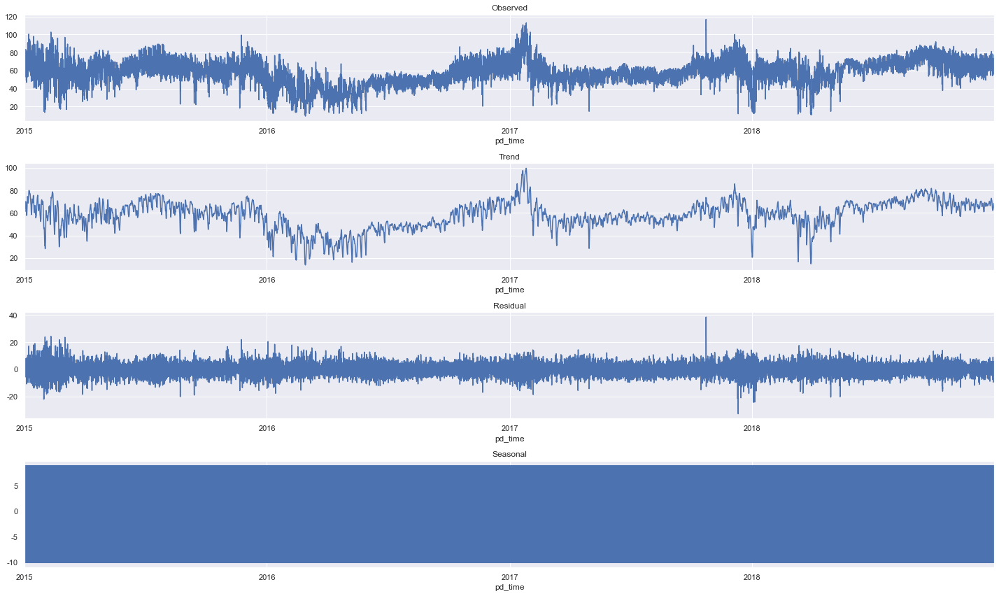

In [52]:
res = sm.tsa.seasonal_decompose(bar_df['price actual'], model='additive')

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(20, 12))
res.observed.plot(ax=ax1, title='Observed')
res.trend.plot(ax=ax2, title='Trend')
res.resid.plot(ax=ax3, title='Residual')
res.seasonal.plot(ax=ax4, title='Seasonal')
plt.tight_layout()
plt.show()

#### 对数变换后的时间序列分解，发现差别不大

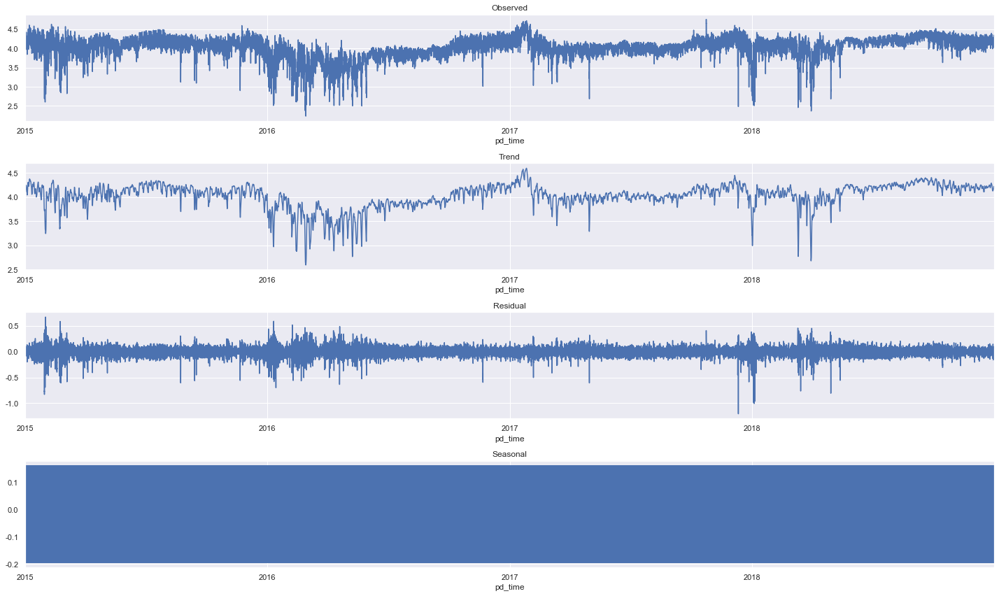

In [53]:
res = sm.tsa.seasonal_decompose(np.log(bar_df['price actual']), model='additive')

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(20, 12))
res.observed.plot(ax=ax1, title='Observed')
res.trend.plot(ax=ax2, title='Trend')
res.resid.plot(ax=ax3, title='Residual')
res.seasonal.plot(ax=ax4, title='Seasonal')
plt.tight_layout()
plt.show()

#### 单位根检验与平稳性检验

In [54]:
y = bar_df['price actual']
adf_test = adfuller(y, regression='c')
print('ADF Statistic: {:.6f}\np-value: {:.6f}\n#Lags used: {}'
      .format(adf_test[0], adf_test[1], adf_test[2]))
for key, value in adf_test[4].items():
    print('Critical Value ({}): {:.6f}'.format(key, value))

ADF Statistic: -9.147016
p-value: 0.000000
#Lags used: 50
Critical Value (1%): -3.430537
Critical Value (5%): -2.861623
Critical Value (10%): -2.566814


In [55]:
kpss_test = kpss(y, regression='c', lags='legacy')
print('KPSS Statistic: {:.6f}\np-value: {:.6f}\n#Lags used: {}'
      .format(kpss_test[1], kpss_test[1], kpss_test[2]))
for key, value in kpss_test[3].items():
    print('Critical Value ({}): {:.6f}'.format(key, value))

KPSS Statistic: 0.010000
p-value: 0.010000
#Lags used: 52
Critical Value (10%): 0.347000
Critical Value (5%): 0.463000
Critical Value (2.5%): 0.574000
Critical Value (1%): 0.739000


#### acf与pacf图

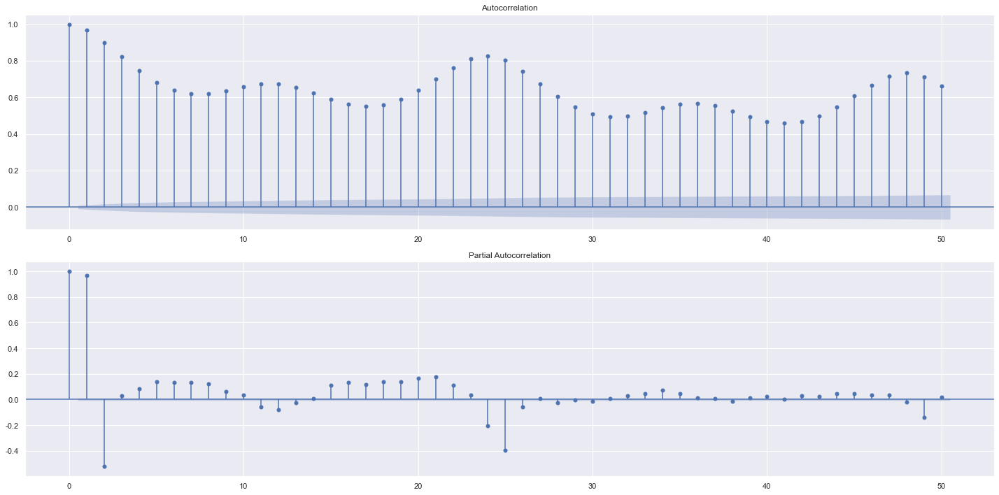

In [56]:
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(20, 10))
plot_acf(bar_df['price actual'], lags=50, ax=ax1)
plot_pacf(bar_df['price actual'], lags=50, ax=ax2)
plt.tight_layout()
plt.show()

#### 考察电价与总负荷之间的相关关系（相关性分析）

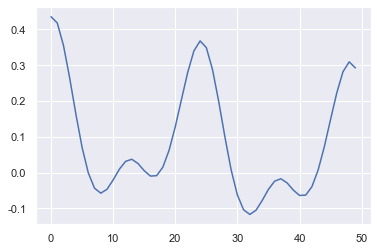

In [57]:
cross_corr = ccf(total_df['total load actual'], total_df['price actual'])
plt.plot(cross_corr[0:50])
plt.show()


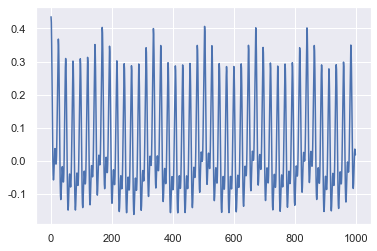

In [55]:

plt.plot(cross_corr[0:1000])
plt.show()

In [58]:
#巴塞罗那和塞维利亚不下雪，故删去字段
bar_df = bar_df.drop(['snow_3h'], axis=1)
sev_df = sev_df.drop(['snow_3h'], axis=1)

#### 定义用电峰期与谷期

In [288]:
# for i in range(len(bar_df)):
#     position = bar_df_time.index[i]
#     hour = position.hour
#     weekday = position.weekday()
#     month = position.month
#     year = position.year
#     bar_df_time.loc[position, 'hour'] = hour
#     bar_df_time.loc[position, 'weekday'] = weekday
#     bar_df_time.loc[position, 'month'] = month
#     bar_df_time.loc[position, 'year'] = year

In [59]:
for i in range(len(bar_df)):
    position = bar_df.index[i]
    hour = position.hour
    if (hour >= 8 and hour <= 18) :
        bar_df.loc[position, 'business hour'] = 2
    elif (hour > 18 and hour <= 24):
        bar_df.loc[position, 'business hour'] = 1
    else:
        bar_df.loc[position, 'business hour'] = 0

for i in range(len(bar_df)):
    position = bar_df.index[i]
    weekday = position.weekday()
    if (weekday == 6):
        bar_df.loc[position, 'weekday'] = 2
    elif (weekday == 5):
        bar_df.loc[position, 'weekday'] = 1
    else:
        bar_df.loc[position, 'weekday'] = 0

In [60]:
for i in range(len(bil_df)):
    position = bil_df.index[i]
    hour = position.hour
    if (hour >= 8 and hour <= 18) :
        bil_df.loc[position, 'business hour'] = 2
    elif (hour > 18 and hour <= 24):
        bil_df.loc[position, 'business hour'] = 1
    else:
        bil_df.loc[position, 'business hour'] = 0

for i in range(len(bil_df)):
    position = bil_df.index[i]
    weekday = position.weekday()
    if (weekday == 6):
        bil_df.loc[position, 'weekday'] = 2
    elif (weekday == 5):
        bil_df.loc[position, 'weekday'] = 1
    else:
        bil_df.loc[position, 'weekday'] = 0

In [61]:
for i in range(len(mad_df)):
    position = mad_df.index[i]
    hour = position.hour
    if (hour >= 8 and hour <= 18) :
        mad_df.loc[position, 'business hour'] = 2
    elif (hour > 18 and hour <= 24):
        mad_df.loc[position, 'business hour'] = 1
    else:
        mad_df.loc[position, 'business hour'] = 0

for i in range(len(mad_df)):
    position = mad_df.index[i]
    weekday = position.weekday()
    if (weekday == 6):
        mad_df.loc[position, 'weekday'] = 2
    elif (weekday == 5):
        mad_df.loc[position, 'weekday'] = 1
    else:
        mad_df.loc[position, 'weekday'] = 0

In [62]:
for i in range(len(sev_df)):
    position = sev_df.index[i]
    hour = position.hour
    if (hour >= 8 and hour <= 18) :
        sev_df.loc[position, 'business hour'] = 2
    elif (hour > 18 and hour <= 24):
        sev_df.loc[position, 'business hour'] = 1
    else:
        sev_df.loc[position, 'business hour'] = 0

for i in range(len(sev_df)):
    position = sev_df.index[i]
    weekday = position.weekday()
    if (weekday == 6):
        sev_df.loc[position, 'weekday'] = 2
    elif (weekday == 5):
        sev_df.loc[position, 'weekday'] = 1
    else:
        sev_df.loc[position, 'weekday'] = 0

In [63]:
for i in range(len(val_df)):
    position = val_df.index[i]
    hour = position.hour
    if (hour >= 8 and hour <= 18) :
        val_df.loc[position, 'business hour'] = 2
    elif (hour > 18 and hour <= 24):
        val_df.loc[position, 'business hour'] = 1
    else:
        val_df.loc[position, 'business hour'] = 0

for i in range(len(val_df)):
    position = val_df.index[i]
    weekday = position.weekday()
    if (weekday == 6):
        val_df.loc[position, 'weekday'] = 2
    elif (weekday == 5):
        val_df.loc[position, 'weekday'] = 1
    else:
        val_df.loc[position, 'weekday'] = 0

In [62]:
bil_df

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon,business hour,weekday
pd_time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,2015-01-01 00:00:00+01:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,65.41,Bilbao,269.657312,269.657312,269.657312,1036.0,97,0.0,226,0.0,0.0,0,800,clear,sky is clear,1,1.0,0.0
2015-01-01 00:00:00+00:00,2015-01-01 01:00:00+01:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,64.92,Bilbao,269.763500,269.763500,269.763500,1035.0,97,0.0,229,0.0,0.0,0,800,clear,sky is clear,1,0.0,0.0
2015-01-01 01:00:00+00:00,2015-01-01 02:00:00+01:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,64.48,Bilbao,269.251688,269.251688,269.251688,1036.0,97,1.0,224,0.0,0.0,0,800,clear,sky is clear,1,0.0,0.0
2015-01-01 02:00:00+00:00,2015-01-01 03:00:00+01:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,59.32,Bilbao,269.203344,269.203344,269.203344,1035.0,97,1.0,225,0.0,0.0,0,800,clear,sky is clear,1,0.0,0.0
2015-01-01 03:00:00+00:00,2015-01-01 04:00:00+01:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,56.04,Bilbao,269.485500,269.485500,269.485500,1035.0,97,1.0,221,0.0,0.0,0,800,clear,sky is clear,1,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 18:00:00+00:00,2018-12-31 19:00:00+01:00,297.0,0.0,7634.0,2628.0,178.0,1.0,1135.0,4836.0,6073.0,63.0,95.0,85.0,277.0,3113.0,96.0,3253.0,30619.0,30653.0,68.85,77.02,Bilbao,281.260000,280.150000,282.150000,1033.0,93,0.0,57,0.0,0.0,0,800,clear,sky is clear,01n,2.0,0.0
2018-12-31 19:00:00+00:00,2018-12-31 20:00:00+01:00,296.0,0.0,7241.0,2566.0,174.0,1.0,1172.0,3931.0,6074.0,62.0,95.0,33.0,280.0,3288.0,51.0,3353.0,29932.0,29735.0,68.40,76.16,Bilbao,279.810000,278.150000,281.150000,1034.0,93,1.0,0,0.0,0.0,0,800,clear,sky is clear,01n,1.0,0.0
2018-12-31 20:00:00+00:00,2018-12-31 21:00:00+01:00,292.0,0.0,7025.0,2422.0,168.0,50.0,1148.0,2831.0,6076.0,61.0,94.0,31.0,286.0,3503.0,36.0,3404.0,27903.0,28071.0,66.88,74.30,Bilbao,277.150000,277.150000,277.150000,1034.0,100,1.0,140,0.0,0.0,0,800,clear,sky is clear,01n,1.0,0.0


#### 对于单个城市的数据分析看一下巴塞罗那的数据集

In [63]:
bar_df

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,clouds_all,weather_id,weather_main,weather_description,weather_icon,business hour,weekday
pd_time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,2015-01-01 00:00:00+01:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,65.41,Barcelona,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,800,clear,sky is clear,01n,1.0,0.0
2015-01-01 00:00:00+00:00,2015-01-01 01:00:00+01:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,64.92,Barcelona,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,800,clear,sky is clear,01n,0.0,0.0
2015-01-01 01:00:00+00:00,2015-01-01 02:00:00+01:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,64.48,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0
2015-01-01 02:00:00+00:00,2015-01-01 03:00:00+01:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,59.32,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0
2015-01-01 03:00:00+00:00,2015-01-01 04:00:00+01:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,56.04,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 18:00:00+00:00,2018-12-31 19:00:00+01:00,297.0,0.0,7634.0,2628.0,178.0,1.0,1135.0,4836.0,6073.0,63.0,95.0,85.0,277.0,3113.0,96.0,3253.0,30619.0,30653.0,68.85,77.02,Barcelona,284.130,282.150,286.150,1027.0,71,1.0,250,0.0,0,800,clear,sky is clear,01n,2.0,0.0
2018-12-31 19:00:00+00:00,2018-12-31 20:00:00+01:00,296.0,0.0,7241.0,2566.0,174.0,1.0,1172.0,3931.0,6074.0,62.0,95.0,33.0,280.0,3288.0,51.0,3353.0,29932.0,29735.0,68.40,76.16,Barcelona,282.640,281.150,284.150,1027.0,62,3.0,270,0.0,0,800,clear,sky is clear,01n,1.0,0.0
2018-12-31 20:00:00+00:00,2018-12-31 21:00:00+01:00,292.0,0.0,7025.0,2422.0,168.0,50.0,1148.0,2831.0,6076.0,61.0,94.0,31.0,286.0,3503.0,36.0,3404.0,27903.0,28071.0,66.88,74.30,Barcelona,282.140,280.150,284.150,1028.0,53,4.0,300,0.0,0,800,clear,sky is clear,01n,1.0,0.0


In [64]:
bar_info = bar_df.dtypes.to_frame()
bil_info = bil_df.dtypes.to_frame()
mad_info = mad_df.dtypes.to_frame()
sev_info = sev_df.dtypes.to_frame()
val_info = val_df.dtypes.to_frame()
total_info = pd.concat([bar_info,bil_info,mad_info,sev_info,val_info],axis=1)
total_info

,0,0,0,0,0
time,object,object,object,object,object
generation biomass,float64,float64,float64,float64,float64
generation fossil brown coal/lignite,float64,float64,float64,float64,float64
generation fossil gas,float64,float64,float64,float64,float64
generation fossil hard coal,float64,float64,float64,float64,float64
generation fossil oil,float64,float64,float64,float64,float64
generation hydro pumped storage consumption,float64,float64,float64,float64,float64
generation hydro run-of-river and poundage,float64,float64,float64,float64,float64
generation hydro water reservoir,float64,float64,float64,float64,float64
generation nuclear,float64,float64,float64,float64,float64


#### 将时间变量进行分割

In [65]:
def extract_time(df):
    ''' 
    该函数用于将日期与时间区分开
    :param df: 要进行转换的DataFrame
    '''
    dates = df["time"].str.split(" ",n=1,expand=True)[0]
    times = df["time"].str.split(" ",n=1,expand=True)[1]

    df["date"] = dates
    df["hours"] = times.str.split("+",n=1,expand=True)[0]

    df["full_time"]=df["date"] + " " + df["hours"]

    df["full_time"]=pd.to_datetime(df["full_time"],format='%Y-%m-%d %H:%M')
    return df

bar_df = extract_time(bar_df)
bil_df = extract_time(bil_df)
mad_df = extract_time(mad_df)
sev_df = extract_time(sev_df)
val_df = extract_time(val_df)

In [66]:
def extract_from_date(data,time_column):
    ''' 
    该函数用于从日期当中分割日期和时间。日期分为年、月、季度、周、星期几、日。时间分为周、小时等等。
    :param data: 要进行分割的数据。通常为DataFrame形式。
    :time_column: 要进行分割的数据的时间字段名。
    '''
    data["year"]=data[time_column].dt.year
    data["quarter"]=data[time_column].dt.quarter
    data["month"]=data[time_column].dt.month
    data["week"]=data[time_column].dt.week
    data["hour"]=data[time_column].dt.hour
    data["time"]=data[time_column].dt.time
    data['dayofweek'] = data[time_column].dt.dayofweek
    data["dayofmonth"]=data[time_column].dt.day
    data["day_name"]=data[time_column].dt.day_name()
    data['is_weekend'] = np.where(data['day_name'].isin(['Sunday', 'Saturday']), 1,0)
    data["is_year_start"]=data[time_column].dt.is_year_start
    
    return data

bar_df=extract_from_date(bar_df,"full_time")
bil_df=extract_from_date(bil_df,"full_time")
mad_df=extract_from_date(mad_df,"full_time")
sev_df=extract_from_date(sev_df,"full_time")
val_df=extract_from_date(val_df,"full_time")

In [67]:
bar_df

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,clouds_all,weather_id,weather_main,weather_description,weather_icon,business hour,weekday,date,hours,full_time,year,quarter,month,week,hour,dayofweek,dayofmonth,day_name,is_weekend,is_year_start
pd_time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,00:00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,65.41,Barcelona,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,800,clear,sky is clear,01n,1.0,0.0,2015-01-01,00:00:00,2015-01-01 00:00:00,2015,1,1,1,0,3,1,Thursday,0,True
2015-01-01 00:00:00+00:00,01:00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,64.92,Barcelona,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,01:00:00,2015-01-01 01:00:00,2015,1,1,1,1,3,1,Thursday,0,True
2015-01-01 01:00:00+00:00,02:00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,64.48,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,02:00:00,2015-01-01 02:00:00,2015,1,1,1,2,3,1,Thursday,0,True
2015-01-01 02:00:00+00:00,03:00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,59.32,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,03:00:00,2015-01-01 03:00:00,2015,1,1,1,3,3,1,Thursday,0,True
2015-01-01 03:00:00+00:00,04:00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,56.04,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,04:00:00,2015-01-01 04:00:00,2015,1,1,1,4,3,1,Thursday,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 18:00:00+00:00,19:00:00,297.0,0.0,7634.0,2628.0,178.0,1.0,1135.0,4836.0,6073.0,63.0,95.0,85.0,277.0,3113.0,96.0,3253.0,30619.0,30653.0,68.85,77.02,Barcelona,284.130,282.150,286.150,1027.0,71,1.0,250,0.0,0,800,clear,sky is clear,01n,2.0,0.0,2018-12-31,19:00:00,2018-12-31 19:00:00,2018,4,12,1,19,0,31,Monday,0,False
2018-12-31 19:00:00+00:00,20:00:00,296.0,0.0,7241.0,2566.0,174.0,1.0,1172.0,3931.0,6074.0,62.0,95.0,33.0,280.0,3288.0,51.0,3353.0,29932.0,29735.0,68.40,76.16,Barcelona,282.640,281.150,284.150,1027.0,62,3.0,270,0.0,0,800,clear,sky is clear,01n,1.0,0.0,2018-12-31,20:00:00,2018-12-31 20:00:00,2018,4,12,1,20,0,31,Monday,0,False
2018-12-31 20:00:00+00:00,21:00:00,292.0,0.0,7025.0,2422.0,168.0,50.0,1148.0,2831.0,6076.0,61.0,94.0,31.0,286.0,3503.0,36.0,3404.0,27903.0,28071.0,66.88,74.30,Barcelona,282.140,280.150,284.150,1028.0,53,4.0,300,0.0,0,800,clear,sky is clear,01n,1.0,0.0,2018-12-31,21:00:00,2018-12-31 21:00:00,2018,4,12,1,21,0,31,Monday,0,False


In [67]:
bar_info = bar_df.dtypes.to_frame()
bil_info = bil_df.dtypes.to_frame()
mad_info = mad_df.dtypes.to_frame()
sev_info = sev_df.dtypes.to_frame()
val_info = val_df.dtypes.to_frame()
total_info = pd.concat([bar_info,bil_info,mad_info,sev_info,val_info],axis=1)
total_info

,0,0,0,0,0
time,object,object,object,object,object
generation biomass,float64,float64,float64,float64,float64
generation fossil brown coal/lignite,float64,float64,float64,float64,float64
generation fossil gas,float64,float64,float64,float64,float64
generation fossil hard coal,float64,float64,float64,float64,float64
generation fossil oil,float64,float64,float64,float64,float64
generation hydro pumped storage consumption,float64,float64,float64,float64,float64
generation hydro run-of-river and poundage,float64,float64,float64,float64,float64
generation hydro water reservoir,float64,float64,float64,float64,float64
generation nuclear,float64,float64,float64,float64,float64


#### 分割训练集与测试集

训练集与测试集分割。其中47个月作为训练集，最后一个月作为测试集。

In [68]:
train_bar=bar_df.loc[~((bar_df["year"]==2018) & (bar_df["month"]==12))]
test_bar=bar_df.loc[((bar_df["year"]==2018) & (bar_df["month"]==12))] 
train_bil=bil_df.loc[~((bil_df["year"]==2018) & (bil_df["month"]==12))]
test_bil=bil_df.loc[((bil_df["year"]==2018) & (bil_df["month"]==12))] 
train_mad=mad_df.loc[~((mad_df["year"]==2018) & (mad_df["month"]==12))]
test_mad=mad_df.loc[((mad_df["year"]==2018) & (mad_df["month"]==12))] 
train_sev=sev_df.loc[~((sev_df["year"]==2018) & (sev_df["month"]==12))]
test_sev=sev_df.loc[((sev_df["year"]==2018) & (sev_df["month"]==12))] 
train_val=val_df.loc[~((val_df["year"]==2018) & (val_df["month"]==12))]
test_val=val_df.loc[((val_df["year"]==2018) & (val_df["month"]==12))] 

In [70]:
train_bar

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,clouds_all,weather_id,weather_main,weather_description,weather_icon,business hour,weekday,date,hours,full_time,year,quarter,month,week,hour,dayofweek,dayofmonth,day_name,is_weekend,is_year_start
pd_time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,00:00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,65.41,Barcelona,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,800,clear,sky is clear,01n,1.0,0.0,2015-01-01,00:00:00,2015-01-01 00:00:00,2015,1,1,1,0,3,1,Thursday,0,True
2015-01-01 00:00:00+00:00,01:00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,64.92,Barcelona,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,01:00:00,2015-01-01 01:00:00,2015,1,1,1,1,3,1,Thursday,0,True
2015-01-01 01:00:00+00:00,02:00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,64.48,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,02:00:00,2015-01-01 02:00:00,2015,1,1,1,2,3,1,Thursday,0,True
2015-01-01 02:00:00+00:00,03:00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,59.32,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,03:00:00,2015-01-01 03:00:00,2015,1,1,1,3,3,1,Thursday,0,True
2015-01-01 03:00:00+00:00,04:00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,56.04,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,04:00:00,2015-01-01 04:00:00,2015,1,1,1,4,3,1,Thursday,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-30 18:00:00+00:00,19:00:00,355.0,0.0,11477.0,6471.0,319.0,0.0,1288.0,5279.0,5041.0,58.0,100.0,95.0,306.0,6668.0,56.0,6968.0,36076.0,35117.0,69.04,75.52,Barcelona,284.640,283.150,286.150,1018.0,76,3.0,200,0.0,0,800,clear,sky is clear,01n,2.0,0.0,2018-11-30,19:00:00,2018-11-30 19:00:00,2018,4,11,48,19,4,30,Friday,0,False
2018-11-30 19:00:00+00:00,20:00:00,357.0,0.0,11413.0,6508.0,319.0,1.0,1274.0,4407.0,5040.0,59.0,100.0,71.0,306.0,6645.0,39.0,6671.0,35879.0,35104.0,68.40,74.78,Barcelona,283.140,282.150,284.150,1018.0,87,3.0,290,0.0,0,800,clear,sky is clear,01n,1.0,0.0,2018-11-30,20:00:00,2018-11-30 20:00:00,2018,4,11,48,20,4,30,Friday,0,False
2018-11-30 20:00:00+00:00,21:00:00,356.0,0.0,10380.0,6357.0,319.0,1.0,1231.0,2126.0,5040.0,58.0,101.0,61.0,305.0,6788.0,37.0,6377.0,34798.0,33993.0,66.39,72.58,Barcelona,282.640,281.150,284.150,1018.0,81,3.0,300,0.0,0,800,clear,sky is clear,01n,1.0,0.0,2018-11-30,21:00:00,2018-11-30 21:00:00,2018,4,11,48,21,4,30,Friday,0,False


#### 先以巴塞罗那的数据为例

In [ ]:
# fig = make_subplots()

# fig.add_trace(go.Line(x=train_bar["full_time"],y=train_bar["price actual"],name="price actual"))

# fig.add_trace(go.Line(x=train_bar["full_time"],y=train_bar.rolling(window=24).mean()["price actual"],name="rolling window=24h"))

# fig.add_trace(go.Line(x=train_bar["full_time"],y=train_bar.rolling(window=168).mean()["price actual"],name="rolling window=168h"))

# fig.update_xaxes(rangeslider_visible=True)

# fig.show()

In [303]:
type(train_bar.rolling(window=24))

pandas.core.window.rolling.Rolling

In [304]:
fig.add_trace(go.Line(x=train_bar["full_time"],y=train_bar["price actual"],name="price actual"))

#### 绘制相关性矩阵的热力图

##### 能源数据

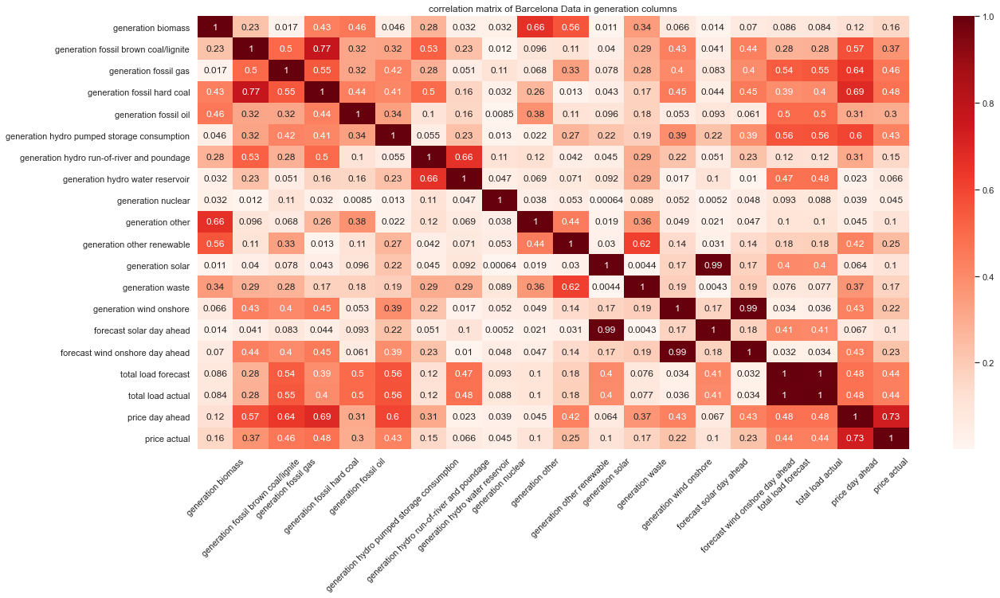

In [305]:
plt.figure(figsize=(20,10));
sns.heatmap(train_bar.iloc[:,:21].corr().abs(),annot=True,cmap="Reds")
plt.xticks(rotation=45)
plt.title('correlation matrix of Barcelona Data in generation columns')
plt.show()

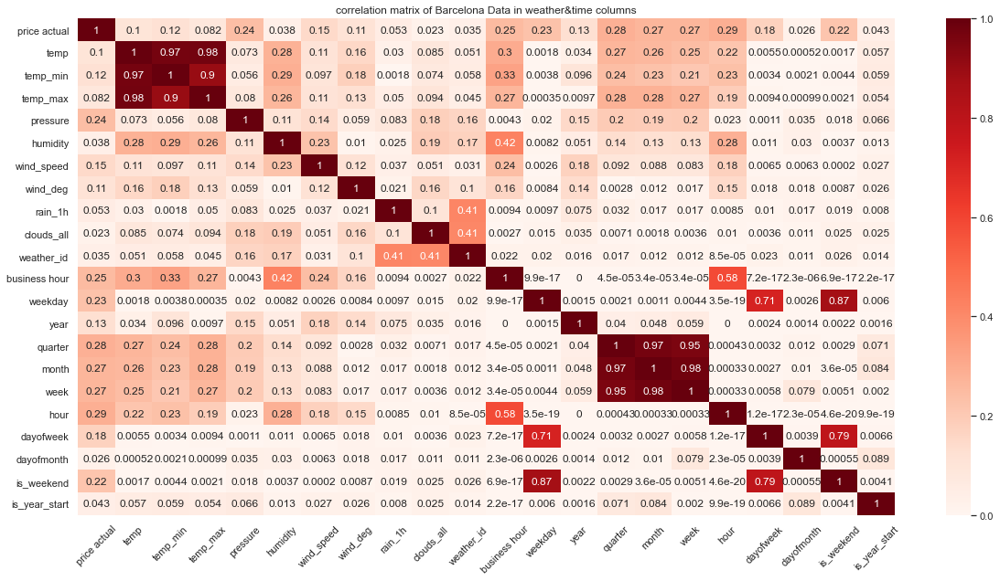

In [70]:
#注意到snow_3h字段的相关性全为空，因为巴塞罗那4年内从未下雪
plt.figure(figsize=(20,10))
sns.heatmap(train_bar.iloc[:,20:].corr().abs(),annot=True,cmap="Reds")
plt.xticks(rotation=45)
plt.title('correlation matrix of Barcelona Data in weather&time columns')
plt.show()

##### 天气数据

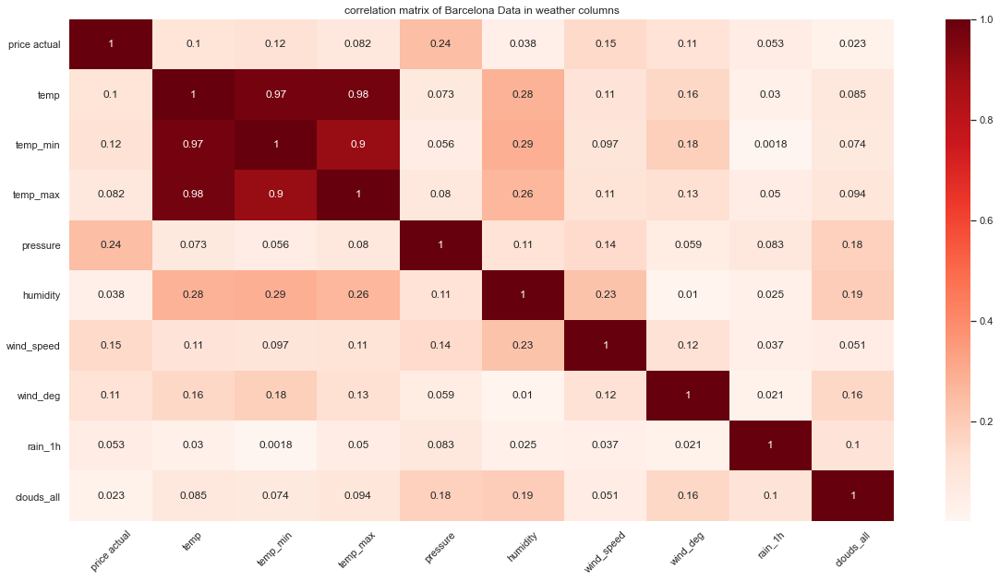

In [69]:
#注意到snow_3h字段的相关性全为空，因为巴塞罗那4年内从未下雪
plt.figure(figsize=(20,10))
sns.heatmap(train_bar.iloc[:,20:31].corr().abs(),annot=True,cmap="Reds")
plt.xticks(rotation=45)
plt.title('correlation matrix of Barcelona Data in weather columns')
plt.show()

#### 天气特征与时间特征

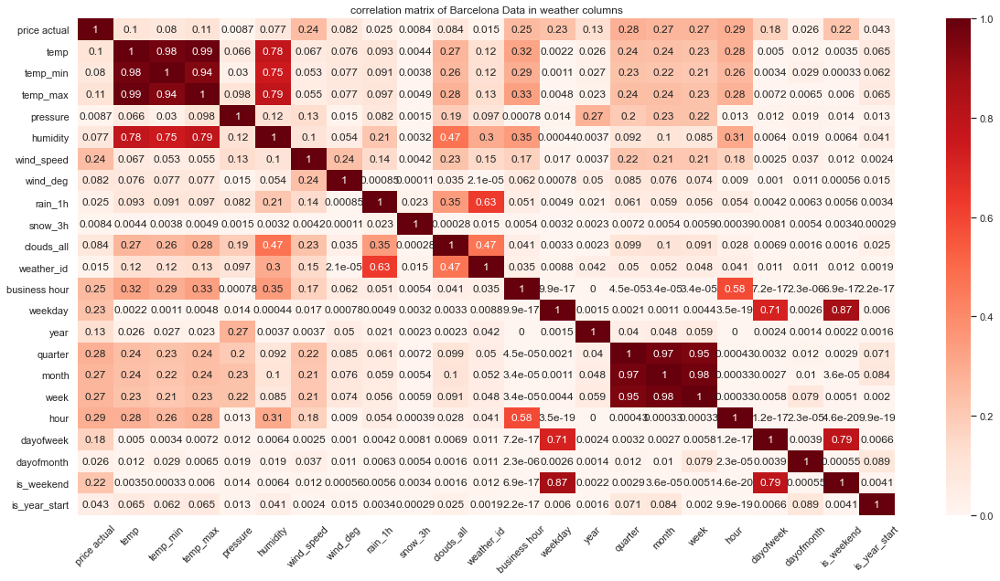

In [307]:
plt.figure(figsize=(20,10))
sns.heatmap(train_mad.iloc[:,20:].corr().abs(),annot=True,cmap="Reds")
plt.xticks(rotation=45)
plt.title('correlation matrix of Barcelona Data in weather columns')
plt.show()

#### 绘制价格密度图、箱线图以及QQ图

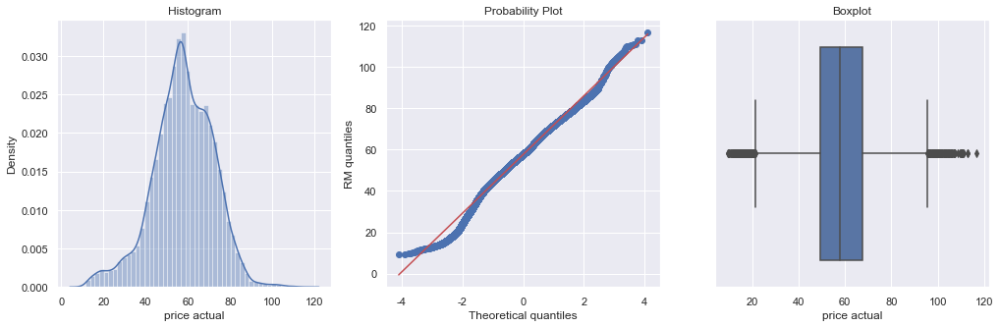

In [221]:
diagnostic_plots(train_bar,'price actual')

#### 观察存在缺失值的字段

In [308]:
bar_na_info = bar_df.isnull().sum().to_frame()
bil_na_info = bil_df.isnull().sum().to_frame()
mad_na_info = mad_df.isnull().sum().to_frame()
sev_na_info = sev_df.isnull().sum().to_frame()
val_na_info = val_df.isnull().sum().to_frame()
total_na_info = pd.concat([bar_na_info,bil_na_info,mad_na_info,sev_na_info,val_na_info],axis=1)
total_na_info.columns = ['Barcelona','Bilbao','Madrid','Seville','Valencia']
total_na_info[total_na_info.mean(axis=1)>0]

,Barcelona,Bilbao,Madrid,Seville,Valencia


#### 对各个变量进行诊断分析

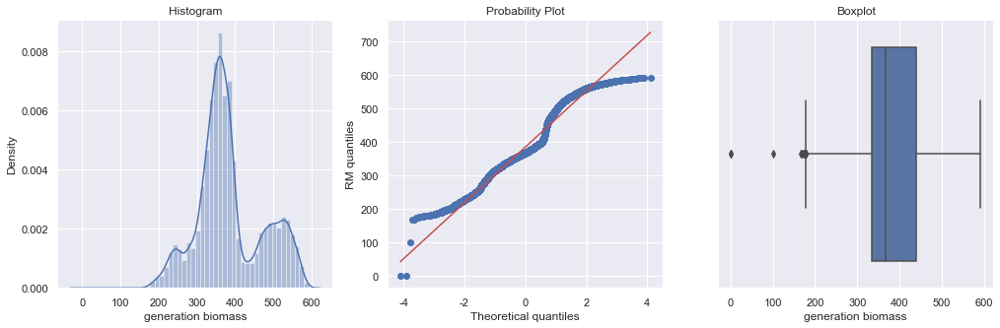

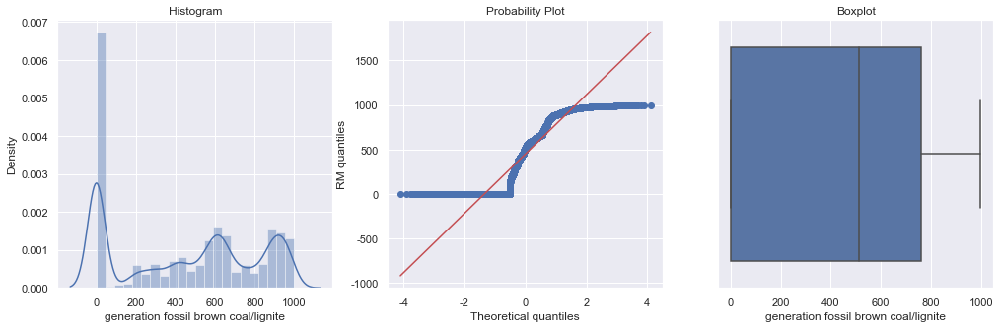

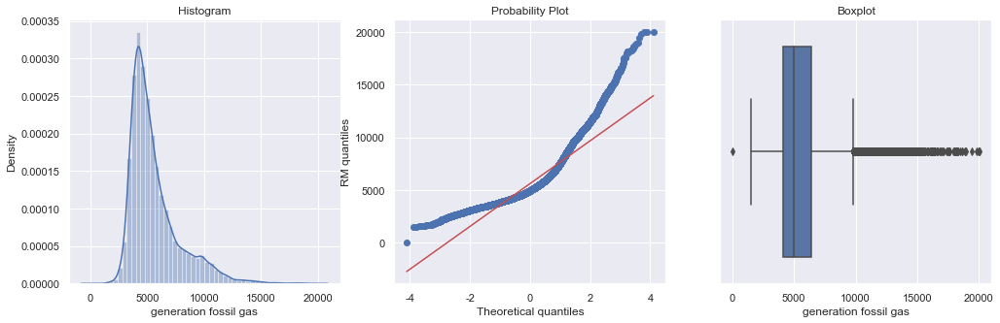

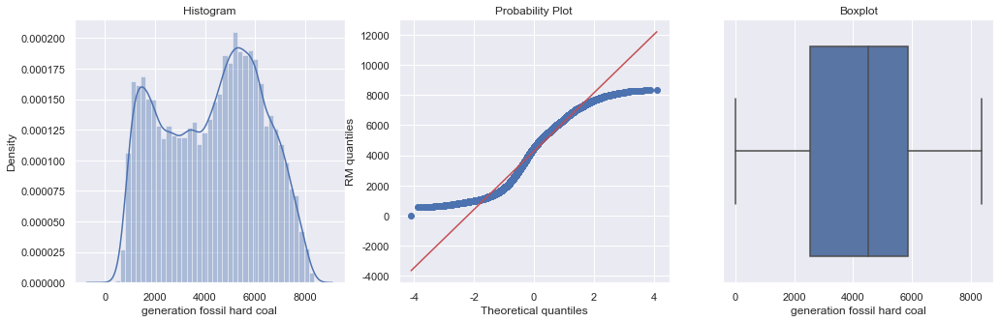

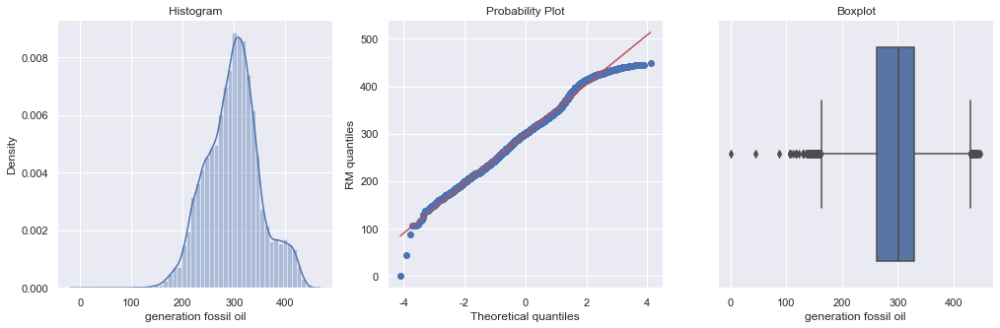

...

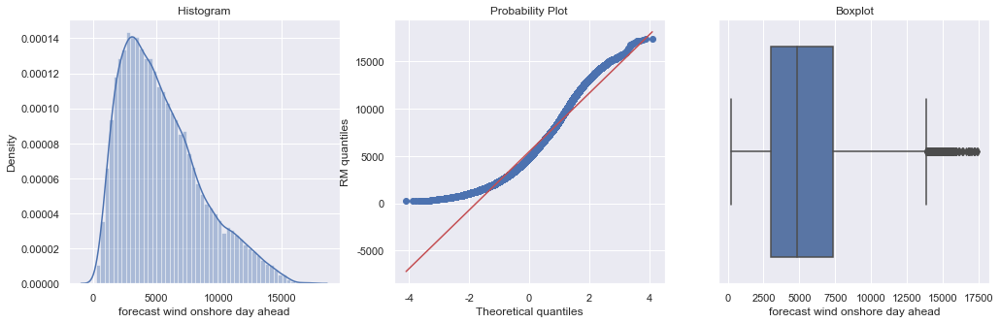

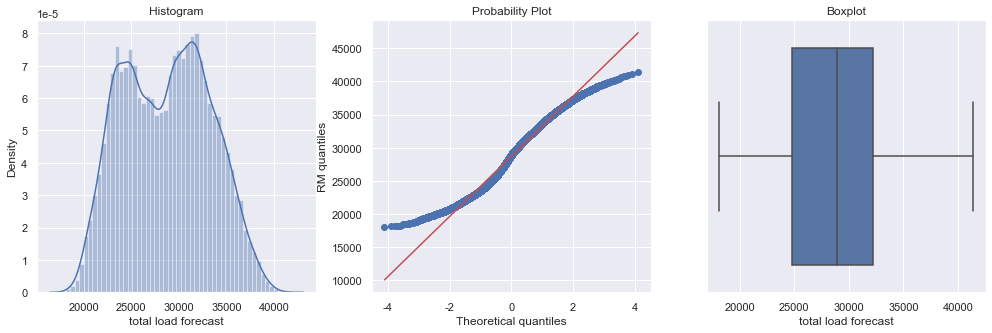

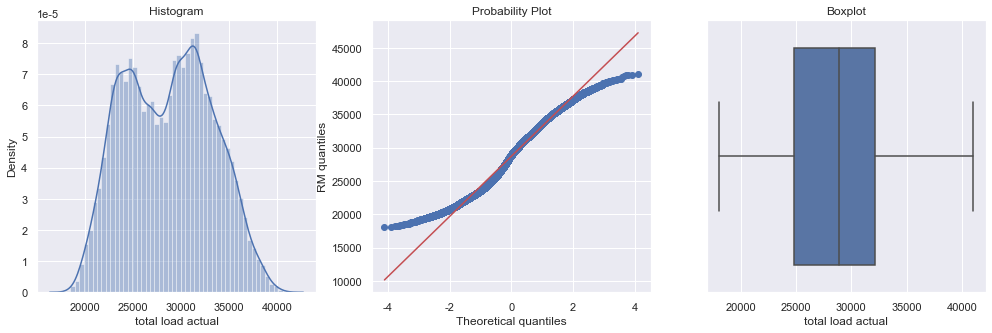

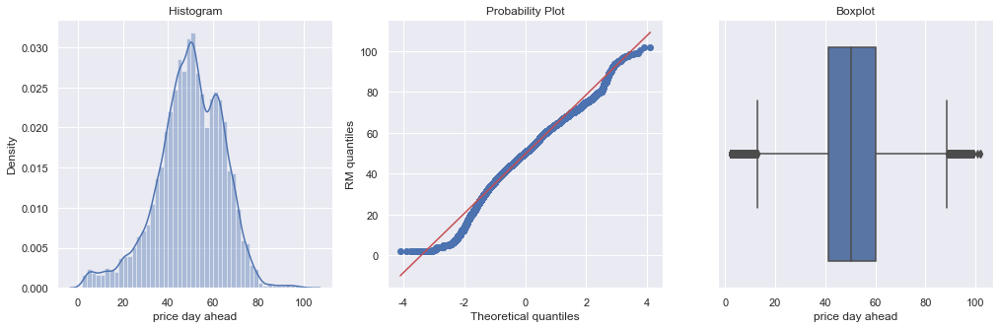

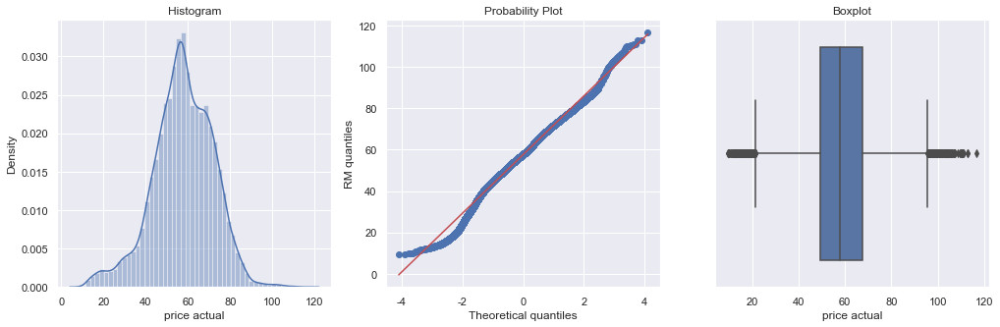

In [223]:
for col in train_bar.select_dtypes(exclude="O").columns[:20].to_list():  #O代表object，即排除掉非数值类型
        diagnostic_plots(train_bar.dropna(),col)  #需要去掉na再进行诊断分析

#### 一些变量进行boxcox变换

In [75]:
bar_df['generation fossil gas']=boxcox(bar_df['generation fossil gas']+1,lmbda=0.2)
bar_df['generation fossil hard coal']=boxcox(bar_df['generation fossil hard coal']+1,lmbda=0.2)
bar_df['generation hydro run-of-river and poundage']=boxcox(bar_df['generation hydro run-of-river and poundage']+1,lmbda=0.2)
bar_df['generation hydro water reservoir']=boxcox(bar_df['generation hydro water reservoir']+1,lmbda=0.2)
bar_df['generation waste']=boxcox(bar_df['generation waste']+1,lmbda=0.2)
bar_df['generation wind onshore']=boxcox(bar_df['generation wind onshore']+1,lmbda=0.2)
bar_df['forecast wind onshore day ahead']=boxcox(bar_df['forecast wind onshore day ahead']+1,lmbda=0.2)

In [117]:
bil_df['generation fossil gas']=boxcox(bil_df['generation fossil gas']+1,lmbda=0.2)
bil_df['generation fossil hard coal']=boxcox(bil_df['generation fossil hard coal']+1,lmbda=0.2)
bil_df['generation hydro run-of-river and poundage']=boxcox(bil_df['generation hydro run-of-river and poundage']+1,lmbda=0.2)
bil_df['generation hydro water reservoir']=boxcox(bil_df['generation hydro water reservoir']+1,lmbda=0.2)
bil_df['generation waste']=boxcox(bil_df['generation waste']+1,lmbda=0.2)
bil_df['generation wind onshore']=boxcox(bil_df['generation wind onshore']+1,lmbda=0.2)
bil_df['forecast wind onshore day ahead']=boxcox(bil_df['forecast wind onshore day ahead']+1,lmbda=0.2)

In [118]:
mad_df['generation fossil gas']=boxcox(mad_df['generation fossil gas']+1,lmbda=0.2)
mad_df['generation fossil hard coal']=boxcox(mad_df['generation fossil hard coal']+1,lmbda=0.2)
mad_df['generation hydro run-of-river and poundage']=boxcox(mad_df['generation hydro run-of-river and poundage']+1,lmbda=0.2)
mad_df['generation hydro water reservoir']=boxcox(mad_df['generation hydro water reservoir']+1,lmbda=0.2)
mad_df['generation waste']=boxcox(mad_df['generation waste']+1,lmbda=0.2)
mad_df['generation wind onshore']=boxcox(mad_df['generation wind onshore']+1,lmbda=0.2)
mad_df['forecast wind onshore day ahead']=boxcox(mad_df['forecast wind onshore day ahead']+1,lmbda=0.2)

In [119]:
sev_df['generation fossil gas']=boxcox(sev_df['generation fossil gas']+1,lmbda=0.2)
sev_df['generation fossil hard coal']=boxcox(sev_df['generation fossil hard coal']+1,lmbda=0.2)
sev_df['generation hydro run-of-river and poundage']=boxcox(sev_df['generation hydro run-of-river and poundage']+1,lmbda=0.2)
sev_df['generation hydro water reservoir']=boxcox(sev_df['generation hydro water reservoir']+1,lmbda=0.2)
sev_df['generation waste']=boxcox(sev_df['generation waste']+1,lmbda=0.2)
sev_df['generation wind onshore']=boxcox(sev_df['generation wind onshore']+1,lmbda=0.2)
sev_df['forecast wind onshore day ahead']=boxcox(sev_df['forecast wind onshore day ahead']+1,lmbda=0.2)

In [120]:
val_df['generation fossil gas']=boxcox(val_df['generation fossil gas']+1,lmbda=0.2)
val_df['generation fossil hard coal']=boxcox(val_df['generation fossil hard coal']+1,lmbda=0.2)
val_df['generation hydro run-of-river and poundage']=boxcox(val_df['generation hydro run-of-river and poundage']+1,lmbda=0.2)
val_df['generation hydro water reservoir']=boxcox(val_df['generation hydro water reservoir']+1,lmbda=0.2)
val_df['generation waste']=boxcox(val_df['generation waste']+1,lmbda=0.2)
val_df['generation wind onshore']=boxcox(val_df['generation wind onshore']+1,lmbda=0.2)
val_df['forecast wind onshore day ahead']=boxcox(val_df['forecast wind onshore day ahead']+1,lmbda=0.2)

#### 一些变量进行对数变换

In [77]:
bar_df['generation fossil brown coal/lignite']=np.log(bar_df['generation fossil brown coal/lignite']+1)
bar_df['generation hydro pumped storage consumption']=np.log(bar_df['generation hydro pumped storage consumption']+1)
bar_df['generation solar']=np.log(bar_df['generation solar']+1)
bar_df['forecast solar day ahead']=np.log(bar_df['forecast solar day ahead']+1)

In [121]:
bil_df['generation fossil brown coal/lignite']=np.log(bil_df['generation fossil brown coal/lignite']+1)
bil_df['generation hydro pumped storage consumption']=np.log(bil_df['generation hydro pumped storage consumption']+1)
bil_df['generation solar']=np.log(bil_df['generation solar']+1)
bil_df['forecast solar day ahead']=np.log(bil_df['forecast solar day ahead']+1)

In [122]:
mad_df['generation fossil brown coal/lignite']=np.log(mad_df['generation fossil brown coal/lignite']+1)
mad_df['generation hydro pumped storage consumption']=np.log(mad_df['generation hydro pumped storage consumption']+1)
mad_df['generation solar']=np.log(mad_df['generation solar']+1)
mad_df['forecast solar day ahead']=np.log(mad_df['forecast solar day ahead']+1)

In [123]:
sev_df['generation fossil brown coal/lignite']=np.log(sev_df['generation fossil brown coal/lignite']+1)
sev_df['generation hydro pumped storage consumption']=np.log(sev_df['generation hydro pumped storage consumption']+1)
sev_df['generation solar']=np.log(sev_df['generation solar']+1)
sev_df['forecast solar day ahead']=np.log(sev_df['forecast solar day ahead']+1)

In [124]:
val_df['generation fossil brown coal/lignite']=np.log(val_df['generation fossil brown coal/lignite']+1)
val_df['generation hydro pumped storage consumption']=np.log(val_df['generation hydro pumped storage consumption']+1)
val_df['generation solar']=np.log(val_df['generation solar']+1)
val_df['forecast solar day ahead']=np.log(val_df['forecast solar day ahead']+1)

In [79]:
train_bar=bar_df.loc[~((bar_df["year"]==2018) & (bar_df["month"]==12))]
test_bar=bar_df.loc[((bar_df["year"]==2018) & (bar_df["month"]==12))] 
train_bil=bil_df.loc[~((bil_df["year"]==2018) & (bil_df["month"]==12))]
test_bil=bil_df.loc[((bil_df["year"]==2018) & (bil_df["month"]==12))] 
train_mad=mad_df.loc[~((mad_df["year"]==2018) & (mad_df["month"]==12))]
test_mad=mad_df.loc[((mad_df["year"]==2018) & (mad_df["month"]==12))] 
train_sev=sev_df.loc[~((sev_df["year"]==2018) & (sev_df["month"]==12))]
test_sev=sev_df.loc[((sev_df["year"]==2018) & (sev_df["month"]==12))] 
train_val=val_df.loc[~((val_df["year"]==2018) & (val_df["month"]==12))]
test_val=val_df.loc[((val_df["year"]==2018) & (val_df["month"]==12))] 

#### 对变换处理后的结果进行绘制

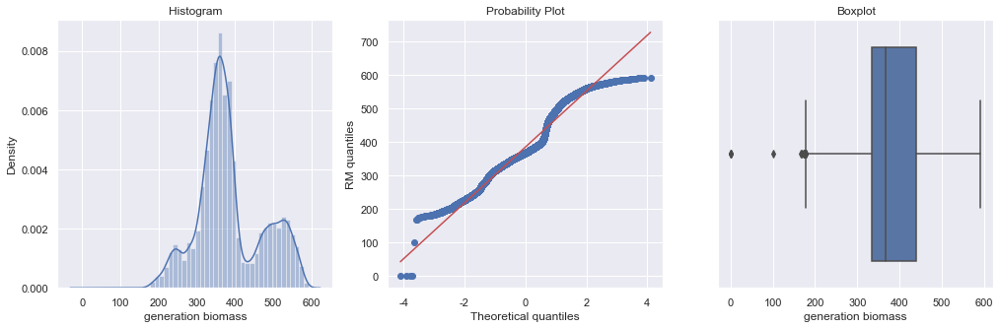

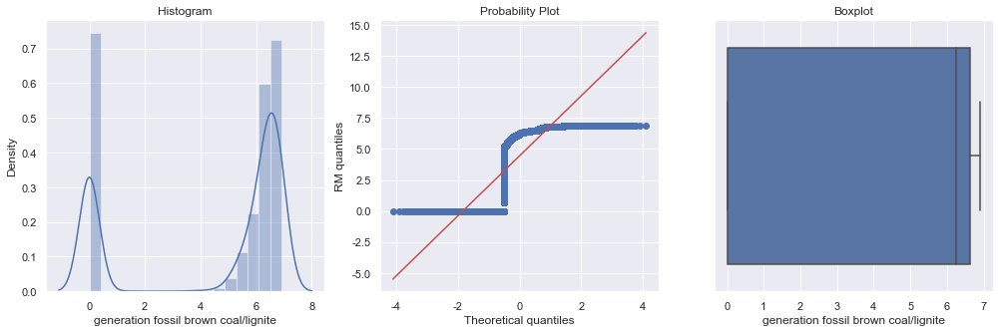

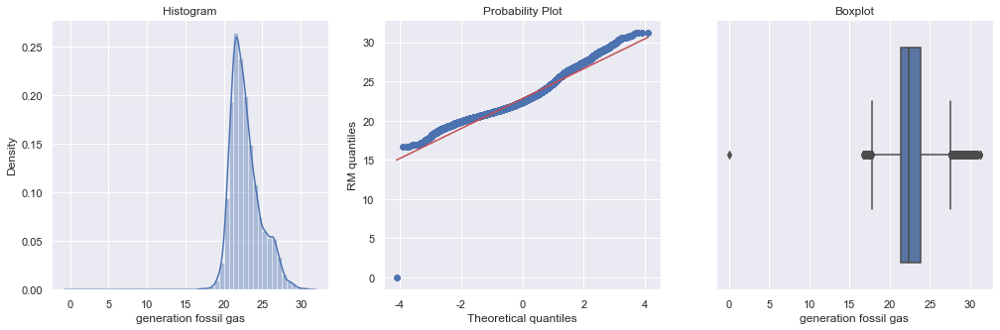

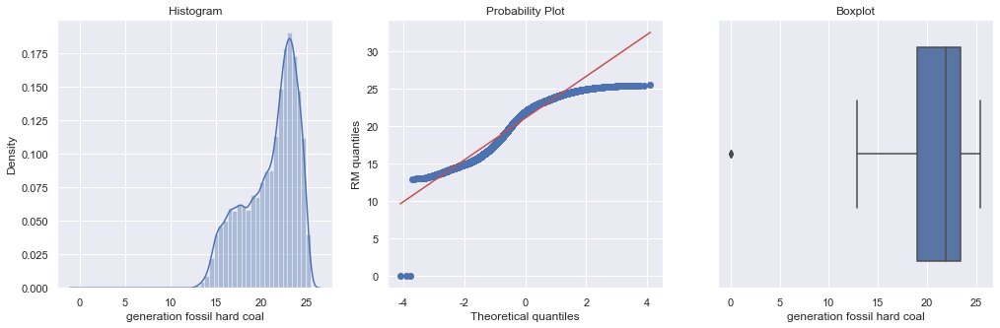

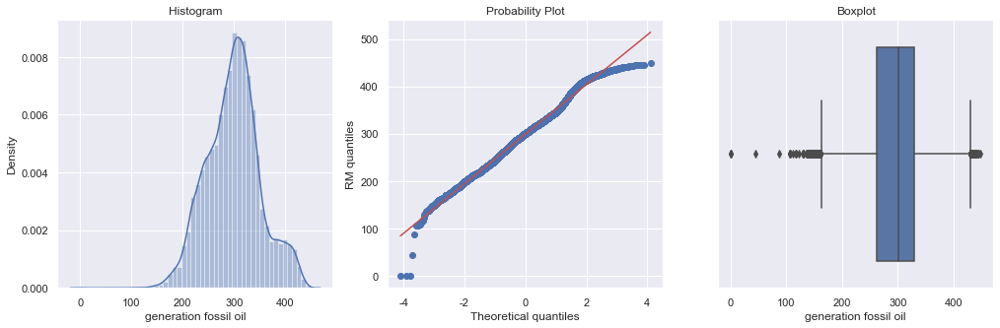

...

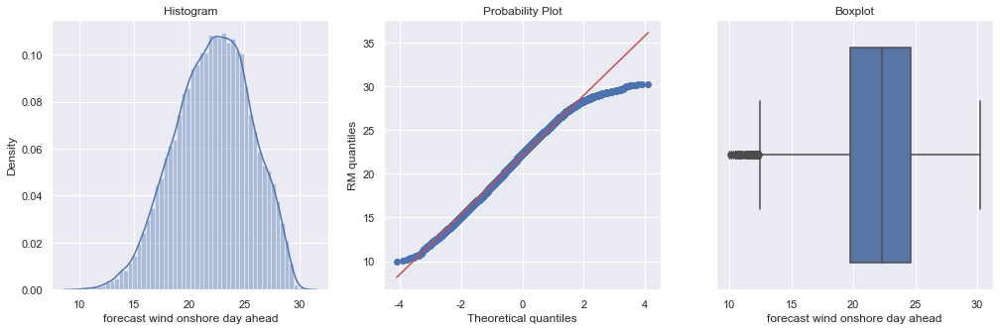

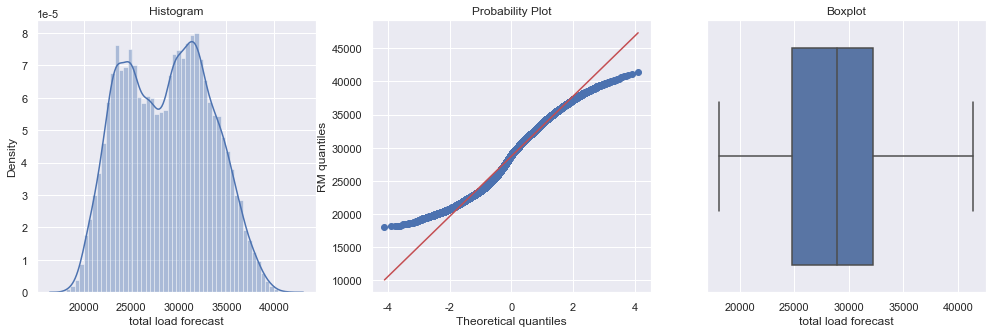

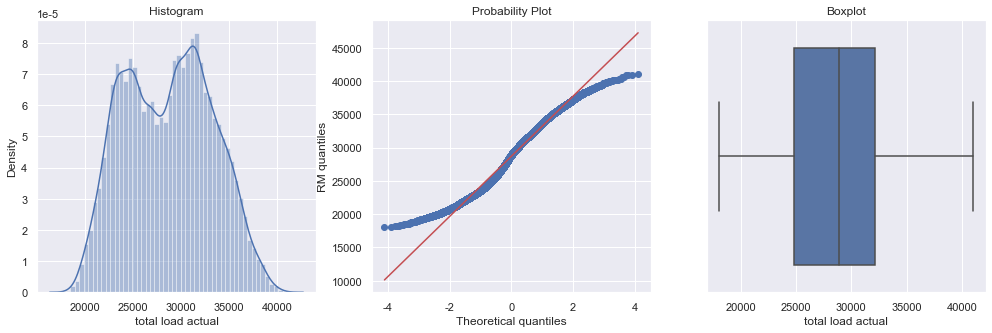

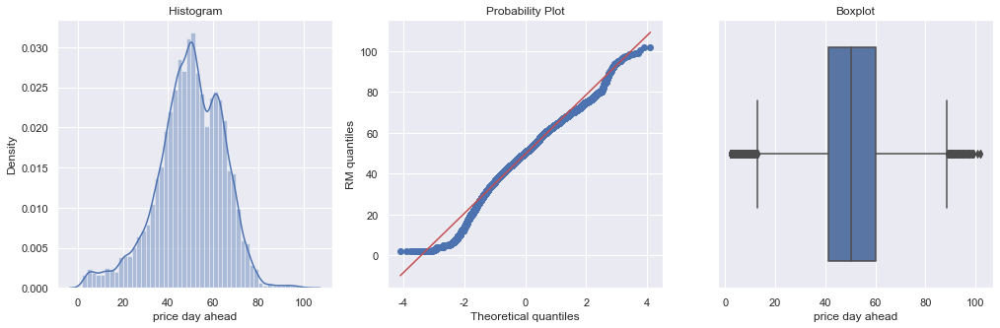

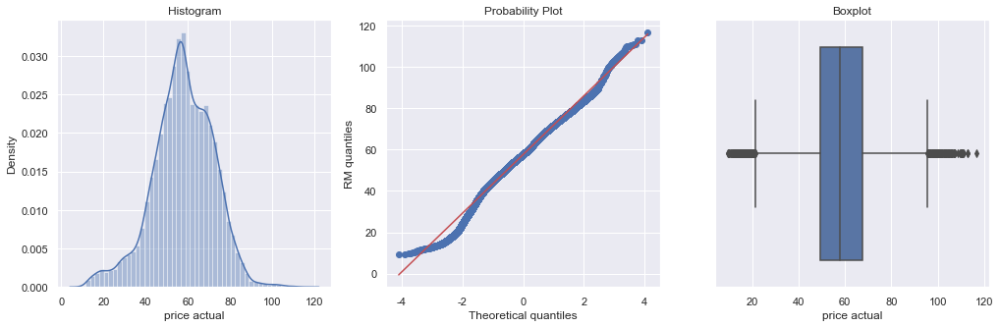

In [92]:
for col in train_bar.select_dtypes(exclude="O").columns[:20].to_list():  #O代表object，即排除掉非数值类型
        diagnostic_plots(train_bar.dropna(),col)  #需要去掉na再进行诊断分析

In [78]:
bar_df

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,clouds_all,weather_id,weather_main,weather_description,weather_icon,business hour,weekday,date,hours,full_time,year,quarter,month,week,hour,dayofweek,dayofmonth,day_name,is_weekend,is_year_start
pd_time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,00:00:00,447.0,5.799093,22.291585,22.265624,162.0,6.761573,15.108198,17.631885,7096.0,43.0,73.0,3.912023,9.383456,23.835038,2.890372,23.887284,26118.0,25385.0,50.10,65.41,Barcelona,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,800,clear,sky is clear,01n,1.0,0.0,2015-01-01,00:00:00,2015-01-01 00:00:00,2015,1,1,1,0,3,1,Thursday,0,True
2015-01-01 00:00:00+00:00,01:00:00,449.0,5.796058,22.677098,22.190574,158.0,6.825460,14.945011,17.026185,7096.0,43.0,71.0,3.931826,9.368824,23.379701,2.833213,23.346866,24934.0,24382.0,48.10,64.92,Barcelona,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,01:00:00,2015-01-01 01:00:00,2015,1,1,1,1,3,1,Thursday,0,True
2015-01-01 01:00:00+00:00,02:00:00,448.0,5.780744,22.306215,21.988641,157.0,7.060476,14.800757,16.205124,7099.0,43.0,73.0,3.931826,9.383456,22.953767,2.197225,22.946598,23515.0,22734.0,47.33,64.48,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,02:00:00,2015-01-01 02:00:00,2015,1,1,1,2,3,1,Thursday,0,True
2015-01-01 02:00:00+00:00,03:00:00,438.0,5.541264,21.666509,21.436385,160.0,7.315884,14.702200,13.940390,7098.0,43.0,75.0,3.931826,9.309691,22.721689,1.098612,22.629001,22642.0,21286.0,42.27,59.32,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,03:00:00,2015-01-01 03:00:00,2015,1,1,1,3,3,1,Thursday,0,True
2015-01-01 03:00:00+00:00,04:00:00,428.0,5.236442,21.435105,21.053068,156.0,7.510431,14.718764,13.644771,7097.0,43.0,74.0,3.761200,9.279754,22.393343,2.302585,22.310710,21785.0,20264.0,38.41,56.04,Barcelona,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,800,clear,sky is clear,01n,0.0,0.0,2015-01-01,04:00:00,2015-01-01 04:00:00,2015,1,1,1,4,3,1,Thursday,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 18:00:00+00:00,19:00:00,297.0,0.000000,24.890406,19.150611,178.0,0.693147,15.419527,22.282566,6073.0,63.0,95.0,4.454347,10.409160,19.982375,4.574711,20.203074,30619.0,30653.0,68.85,77.02,Barcelona,284.130,282.150,286.150,1027.0,71,1.0,250,0.0,0,800,clear,sky is clear,01n,2.0,0.0,2018-12-31,19:00:00,2018-12-31 19:00:00,2018,4,12,1,19,0,31,Monday,0,False
2018-12-31 19:00:00+00:00,20:00:00,296.0,0.000000,24.576155,19.035612,174.0,0.693147,15.550841,21.175363,6074.0,62.0,95.0,3.526361,10.442275,20.257059,3.951244,20.356109,29932.0,29735.0,68.40,76.16,Barcelona,282.640,281.150,284.150,1027.0,62,3.0,270,0.0,0,800,clear,sky is clear,01n,1.0,0.0,2018-12-31,20:00:00,2018-12-31 20:00:00,2018,4,12,1,20,0,31,Monday,0,False
2018-12-31 20:00:00+00:00,21:00:00,292.0,0.000000,24.397584,18.759685,168.0,3.931826,15.466049,19.512559,6076.0,61.0,94.0,3.465736,10.507664,20.578957,3.610918,20.432756,27903.0,28071.0,66.88,74.30,Barcelona,282.140,280.150,284.150,1028.0,53,4.0,300,0.0,0,800,clear,sky is clear,01n,1.0,0.0,2018-12-31,21:00:00,2018-12-31 21:00:00,2018,4,12,1,21,0,31,Monday,0,False


#### 对一些关心的变量绘制trace plot

In [80]:
fig = make_subplots()

fig.add_trace(go.Line(x=train_bar.loc[train_bar["year"]==2018,"full_time"],y=train_bar.loc[train_bar["year"]==2018,"price actual"],name="price actual"))

fig.add_trace(go.Line(x=train_bar.loc[train_bar["year"]==2018,"full_time"],y=train_bar.loc[train_bar["year"]==2018,"temp"],name="Temp"))
fig.add_trace(go.Line(x=train_bar.loc[train_bar["year"]==2018,"full_time"],y=train_bar.loc[train_bar["year"]==2018,"generation waste"],name="generation waste"))
fig.add_trace(go.Line(x=train_bar.loc[train_bar["year"]==2018,"full_time"],y=train_bar.loc[train_bar["year"]==2018,"generation fossil oil"],
                                name="generation fossil oil"))

fig.update_xaxes(rangeslider_visible=True)

fig.show()

#### 对能源变量绘制trace plot（只选择数值字段），进而寻找周期性特征

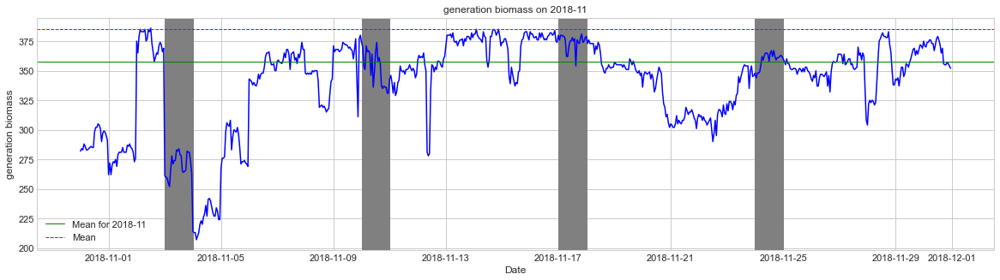

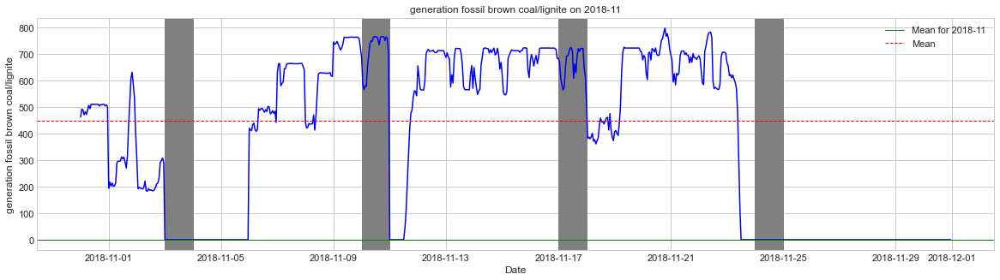

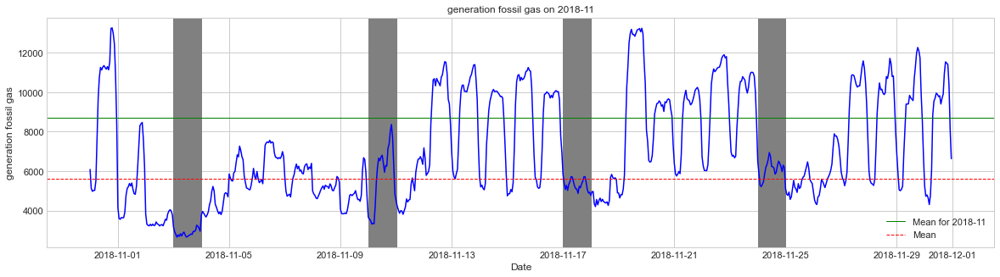

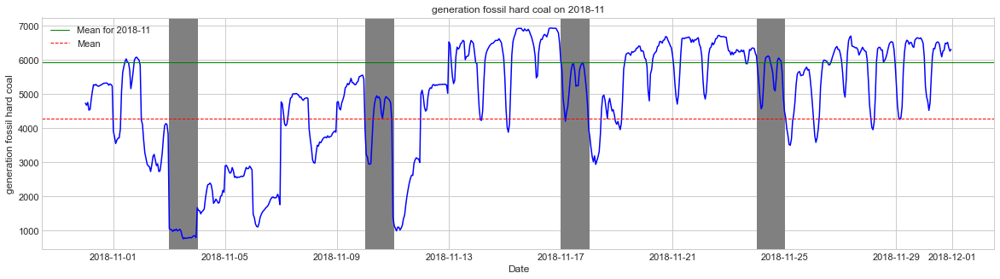

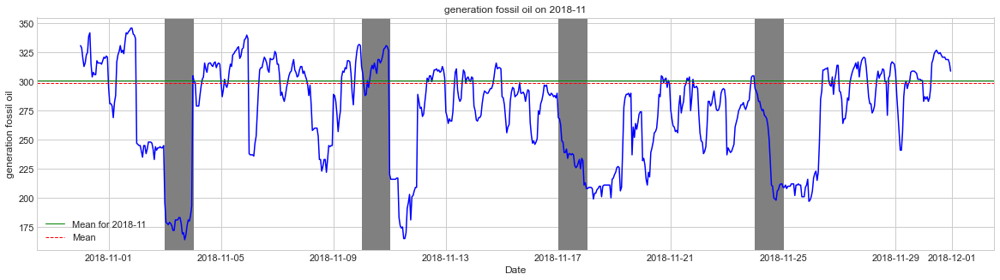

...

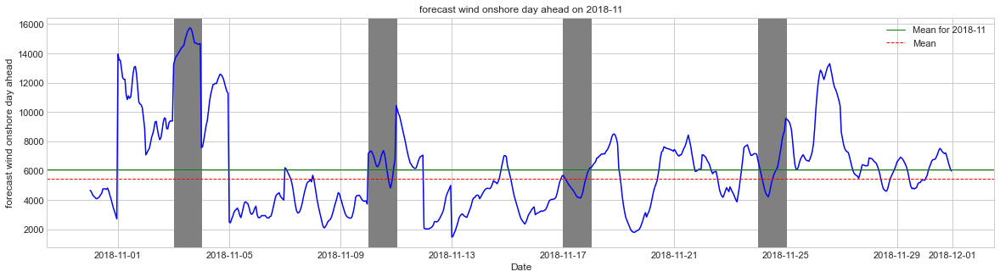

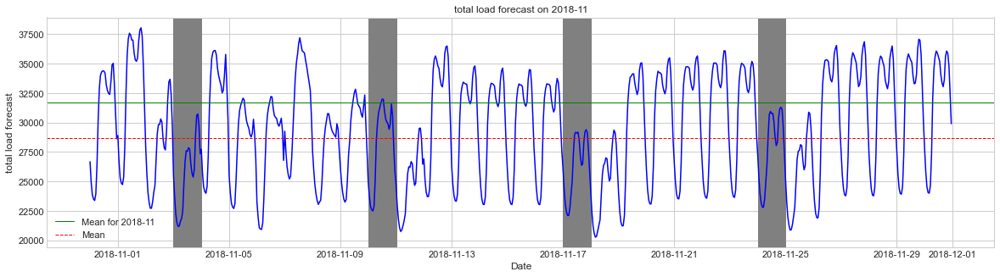

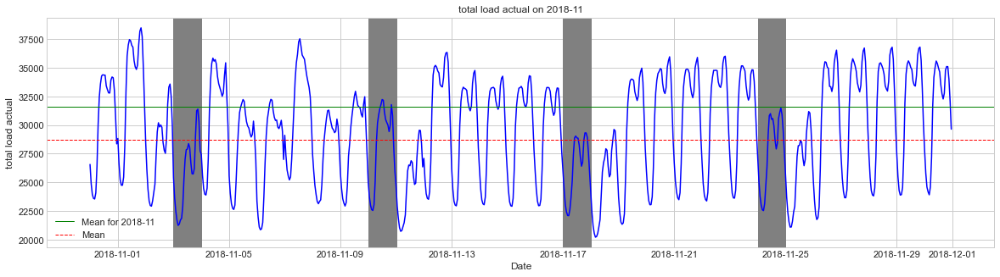

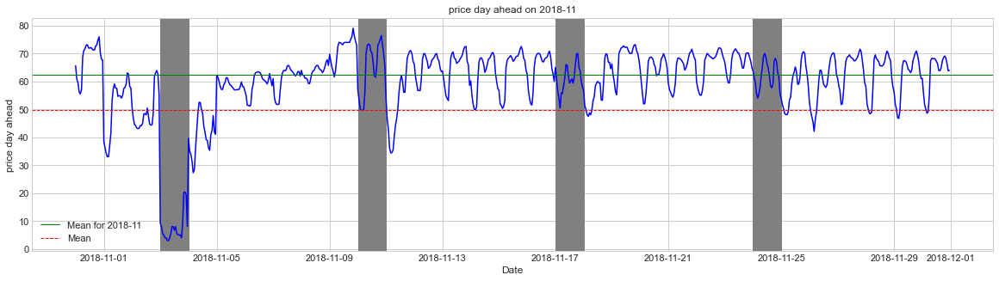

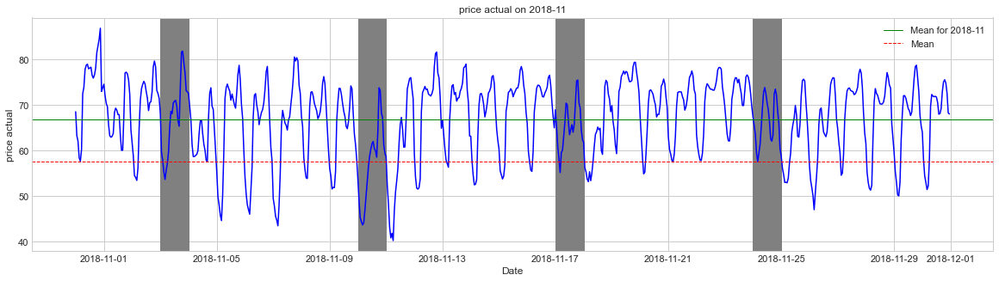

In [225]:
columns_to_plot=train_bar.select_dtypes(exclude="O").columns[:20]

for col in columns_to_plot:
    
    with plt.style.context('seaborn-whitegrid'):
        
        plt.figure(figsize=(20,5));
        plt.plot(train_bar["full_time"].tail(744),train_bar[col].tail(744),color="blue") #绘制最后一个月（测试集）的trace
        
        plt.axhline(train_bar[col].tail(74).mean(),color='green',linestyle='-',linewidth=1,label="Mean for 2018-11"); #最后一个月的均值
        
        plt.axhline(train_bar[col].mean(),color='red',linestyle='--',linewidth=1,label="Mean"); #全局均值的绘制
        
        plt.axvspan("2018-11-03","2018-11-04",color="gray") #将周末用灰色覆盖
        plt.axvspan("2018-11-10","2018-11-11",color="gray")
        plt.axvspan("2018-11-17","2018-11-18",color="gray")
        plt.axvspan("2018-11-24","2018-11-25",color="gray")

        plt.xlabel("Date")
        plt.ylabel(col)
        plt.title(f"{col} on 2018-11")
        plt.legend()
        plt.show();

#### 比较真实电价与day ahead价格之间的差异

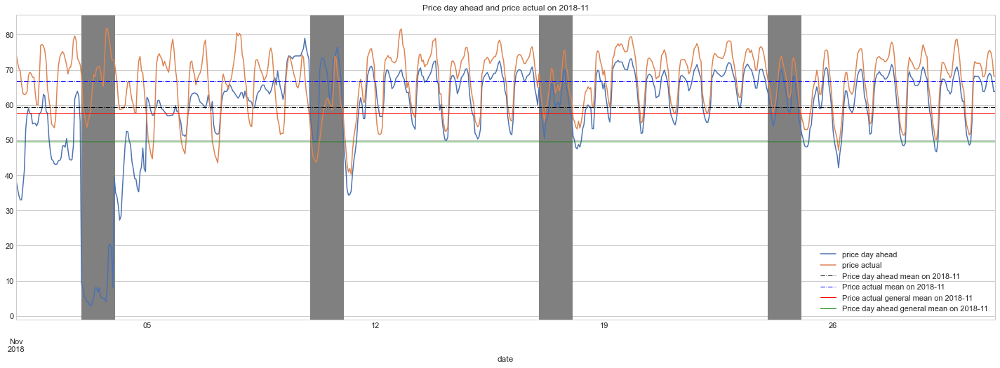

In [226]:
with plt.style.context('seaborn-whitegrid'):
    fig, ax = plt.subplots(figsize=(25,8))

    ax.set_title('Price day ahead and price actual on 2018-11')
    ax = train_bar.tail(720).plot.line(x="full_time",y=['price day ahead',"price actual"],ax=ax)
    ax.set_xlabel("date")
    plt.axvspan("2018-11-03","2018-11-04",color="gray") #weekends
    plt.axvspan("2018-11-10","2018-11-11",color="gray")
    plt.axvspan("2018-11-17","2018-11-18",color="gray")
    plt.axvspan("2018-11-24","2018-11-25",color="gray")

    ax.axhline(train_bar["price day ahead"].tail(720).mean(), 
                                color='black',
                                linestyle='-.',
                                linewidth=1,
                                label="Price day ahead mean on 2018-11"); 
    
    ax.axhline(train_bar["price actual"].tail(720).mean(), 
                                color='blue',
                                linestyle='-.',
                                linewidth=1,
                                label="Price actual mean on 2018-11"); 
    
    ax.axhline(train_bar["price actual"].mean(), 
                                color='red',
                                linestyle='-',
                                linewidth=1,
                                label="Price actual general mean on 2018-11"); 
    
    ax.axhline(train_bar["price day ahead"].mean(), 
                                color='green',
                                linestyle='-',
                                linewidth=1,
                                label="Price day ahead general mean on 2018-11"); 
    plt.legend()

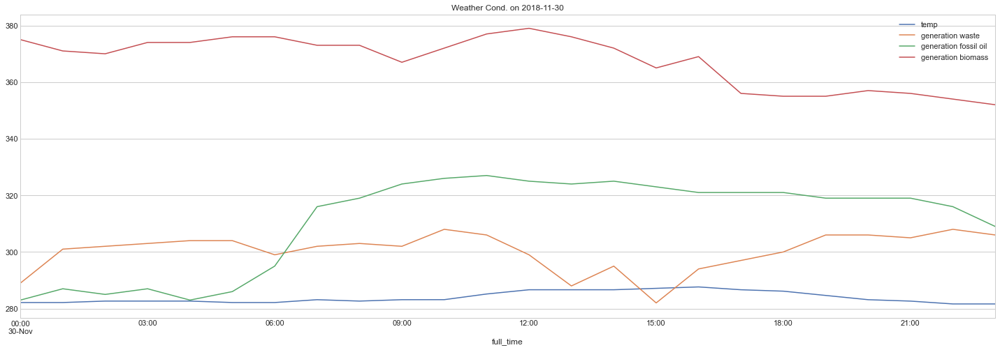

In [227]:
with plt.style.context('seaborn-whitegrid'):
    fig, ax = plt.subplots(figsize=(25,8))

    ax.set_title('Weather Cond. on 2018-11-30')
    ax = train_bar.tail(24).plot.line(x="full_time",
                                  y=["temp","generation waste",
                                   "generation fossil oil",
                                  "generation biomass"],ax=ax)

#### 观察价格随自变量（主要是时间）的波动情况，给出统计柱状图，寻找周期性，便于用电峰期与谷期的定义

In [228]:
def plot_actual_price(price_col,other_col,train):

    ''' 
    该函数用于绘制不同自变量情况下的价格柱状图，便于比较与寻找周期性。
    :param price_col: 数据集的价格字段
    :param other_col: 要绘制的数据集的自变量字段
    :param train: 具体的数据集
    '''
    mean_price=train[price_col].mean()
    
    train.groupby([other_col])[price_col].mean().plot.bar(figsize=(20,6),
                                                            color="blue");
    plt.axhline(train[price_col].mean(),
                                    linestyle='-',
                                    linewidth=2,
                                    color="red");

    plt.axhline(mean_price + train[price_col].std(),
                                    linestyle=':',
                                    linewidth=2,
                                    color="red");

    plt.axhline(mean_price - train[price_col].std(),
                                    linestyle=':',
                                    linewidth=2,
                                    color="red");
    plt.title(f"{price_col}&{other_col} BarPlot");
    plt.show()


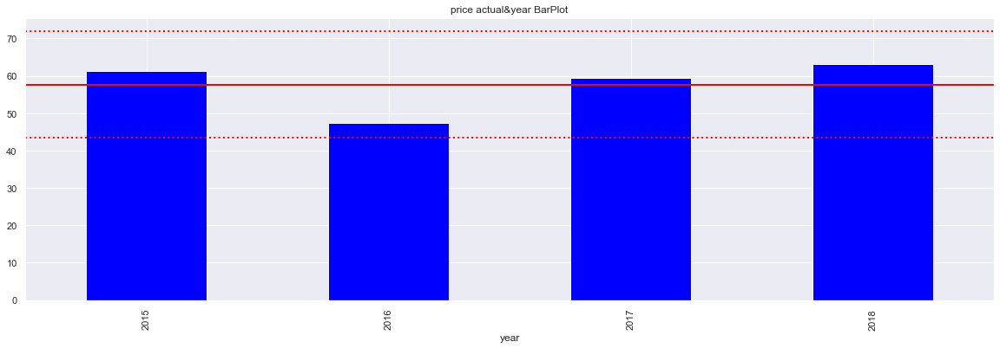

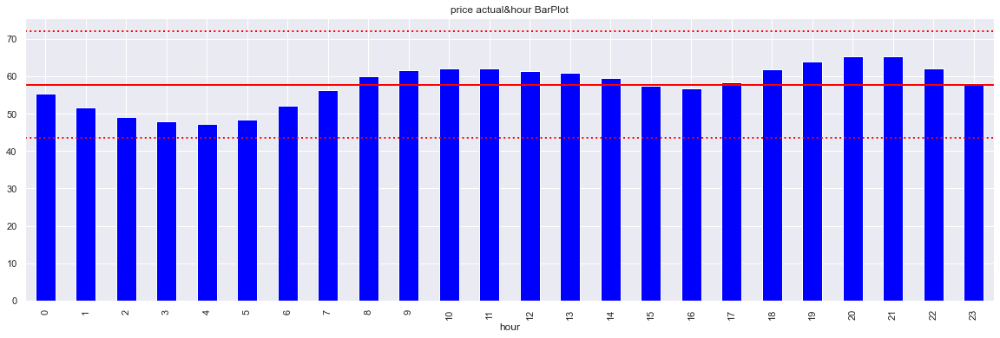

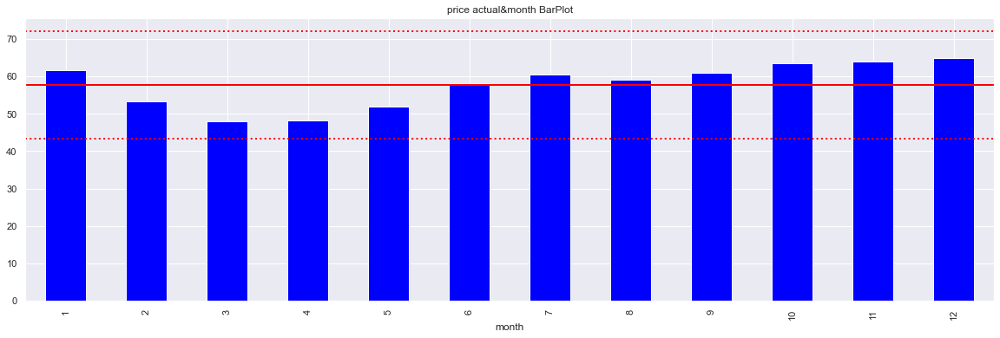

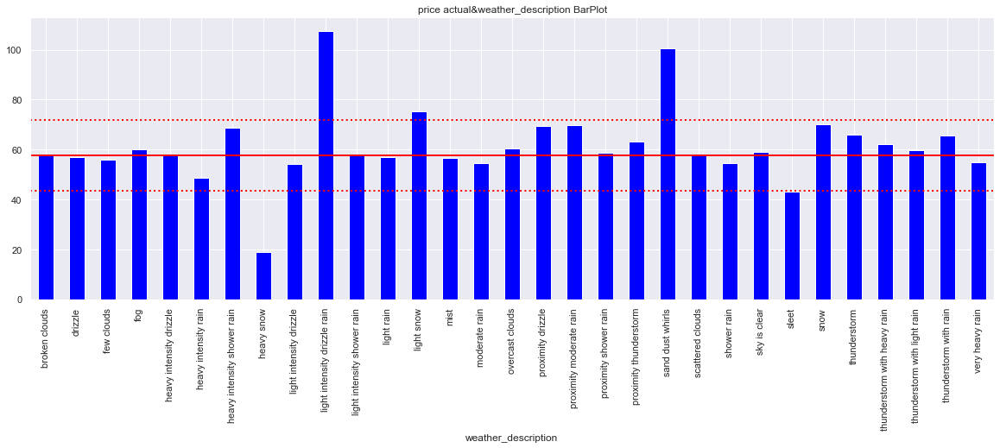

In [229]:
for col in ["year","hour","month","weather_description"]:
    plot_actual_price("price actual",col,train_bar)

#### 绘制感兴趣变量（电力负载）与价格之间的散点图，且采用最小二乘回归

In [73]:
fig = px.scatter(train_bar, x="total load actual", y="price actual", trendline="ols")
fig.show()
results = px.get_trendline_results(fig)
results.px_fit_results.iloc[0].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.190
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                     8041.
Date:                Sun, 08 Jan 2023   Prob (F-statistic):               0.00
Time:                        15:55:44   Log-Likelihood:            -1.3627e+05
No. Observations:               34320   AIC:                         2.725e+05
Df Residuals:                   34318   BIC:                         2.726e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         18.6740      0.441     42.391      0.000      17.811      19.537
x1             0.0014   1.52e-05     89.673      0.000       0.001       0.001
==============================================================================
Omnibus:                     1278.017   Durbin-Watson:                   2.013
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1504.026
Skew:                          -0.446   Prob(JB):                         0.00
Kurtosis:                       3.506   Cond. No.                     1.85e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.85e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### 绘制价格的累积均值图，观察其稳定性

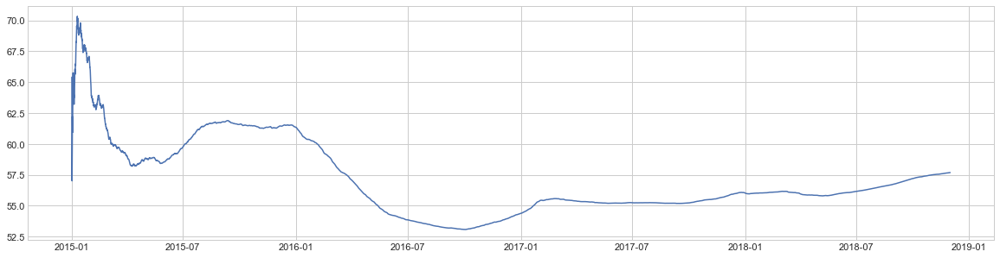

In [74]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(20,5));
    plt.plot(train_bar["full_time"],train_bar["price actual"].expanding().mean())  #expanding()表示遍历从最开始时间到当下
     #所有时期累积均值

#### 填补能源数据当中还剩下的缺失值

In [75]:
missing_bar=train_bar[train_bar.isna().any(axis=1)]
missing_bar.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,clouds_all,weather_id,weather_main,weather_description,weather_icon,business hour,weekday,date,hours,full_time,year,quarter,month,week,hour,dayofweek,dayofmonth,day_name,is_weekend,is_year_start
pd_time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [76]:
train_bar_new=train_bar.drop(["time","city_name","date","hours","full_time","day_name",
                         "weather_id","weather_icon","is_year_start"],axis=1)
test_bar_new=test_bar.drop(["time","city_name","date","hours","full_time","day_name",
                        "weather_id","weather_icon","is_year_start"],axis=1)

train_bil_new=train_bil.drop(["time","city_name","date","hours","full_time","day_name",
                         "weather_id","weather_icon","is_year_start"],axis=1)
test_bil_new=test_bil.drop(["time","city_name","date","hours","full_time","day_name",
                        "weather_id","weather_icon","is_year_start"],axis=1)

train_mad_new=train_mad.drop(["time","city_name","date","hours","full_time","day_name",
                         "weather_id","weather_icon","is_year_start"],axis=1)
test_mad_new=test_mad.drop(["time","city_name","date","hours","full_time","day_name",
                        "weather_id","weather_icon","is_year_start"],axis=1)

train_sev_new=train_sev.drop(["time","city_name","date","hours","full_time","day_name",
                         "weather_id","weather_icon","is_year_start"],axis=1)
test_sev_new=test_sev.drop(["time","city_name","date","hours","full_time","day_name",
                        "weather_id","weather_icon","is_year_start"],axis=1)

train_val_new=train_val.drop(["time","city_name","date","hours","full_time","day_name",
                         "weather_id","weather_icon","is_year_start"],axis=1)
test_val_new=test_val.drop(["time","city_name","date","hours","full_time","day_name",
                        "weather_id","weather_icon","is_year_start"],axis=1)

In [83]:
train_bar_new.shape, test_bar_new.shape

((34320, 41), (744, 41))

In [352]:
train_mad_new.shape, test_mad_new.shape

((34320, 42), (744, 42))

In [138]:
X_train=train_bar_new.drop(["price actual"],axis=1)
y_train=train_bar_new["price actual"]

X_test=test_bar_new.drop(["price actual"],axis=1)
y_test=test_bar_new["price actual"]

In [139]:
encoder = OrdinalEncoder(encoding_method='ordered', variables=['weather_main',"weather_description"])
encoder.fit(X_train, y_train)

X_train_t = encoder.transform(X_train)
X_test_t = encoder.transform(X_test)
encoder.encoder_dict_

{'weather_main': {'drizzle': 0,
  'rain': 1,
  'mist': 2,
  'clouds': 3,
  'clear': 4,
  'fog': 5,
  'snow': 6,
  'thunderstorm': 7,
  'dust': 8},
 'weather_description': {'heavy snow': 0,
  'sleet': 1,
  'heavy intensity rain': 2,
  'light intensity drizzle': 3,
  'shower rain': 4,
  'moderate rain': 5,
  'very heavy rain': 6,
  'few clouds': 7,
  'mist': 8,
  'light rain': 9,
  'drizzle': 10,
  'heavy intensity drizzle': 11,
  'broken clouds': 12,
  'scattered clouds': 13,
  'light intensity shower rain': 14,
  'proximity shower rain': 15,
  'sky is clear': 16,
  'thunderstorm with light rain': 17,
  'fog': 18,
  'overcast clouds': 19,
  'thunderstorm with heavy rain': 20,
  'proximity thunderstorm': 21,
  'thunderstorm with rain': 22,
  'thunderstorm': 23,
  'heavy intensity shower rain': 24,
  'proximity drizzle': 25,
  'proximity moderate rain': 26,
  'snow': 27,
  'light snow': 28,
  'sand dust whirls': 29,
  'light intensity drizzle rain': 30}}

In [140]:
def MAPE(y_actual,y_pred):
    mape = np.mean(np.abs((y_actual - y_pred)/y_actual))*100
    return mape

def WMAPE(y_actual,y_pred):
    wmape = 100 * (np.abs(y_actual - y_pred).sum()) / (np.abs(y_actual).sum())
    return wmape

def result_df(y_actual,y_pred):
    
    r2=r2_score(y_actual,y_pred)
    mse=mean_squared_error(y_actual,y_pred)
    rmse=np.sqrt(mean_squared_error(y_actual,y_pred))
    mae=mean_absolute_error(y_actual,y_pred)
    mape=MAPE(y_actual,y_pred)
    wmape=WMAPE(y_actual,y_pred)
    
    result=pd.DataFrame.from_dict({"r2":[r2],"MSE":[mse],"RMSE":[rmse],
                         "MAE":[mae],"MAPE":[mape],"WMAPE":[wmape]})
    return result

#### 模型建立

In [144]:
def run_lgb(train_X, train_y, val_X, val_y):
    params = {
        "boosting_type":"dart",
        "objective": "regression",
        "metric": ["mape","rmse"],
        "num_iterations":30,
        "reg_lambda":100,
        "learning_rate":0.09
              
    }

    lgtrain = lgb.Dataset(train_X, label=train_y)
    lgval = lgb.Dataset(val_X, label=val_y)
    evals_result = {}
    model = lgb.train(params, lgtrain)

    pred_test_y = model.predict(val_X, num_iteration=model.best_iteration)
    return pred_test_y, model

y_pred,model=run_lgb(X_train_t,y_train,X_test_t,y_test)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5881
[LightGBM] [Info] Number of data points in the train set: 34320, number of used features: 40
[LightGBM] [Info] Start training from score 57.685480


In [145]:
pred_train=model.predict(X_train_t)
result_df(y_train,pred_train)

,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.817138,37.143365,6.094536,3.956081,8.643821,6.858018


In [146]:
result_df(y_test,y_pred)

,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.790728,11.03984,3.322625,2.317063,3.541655,3.456106


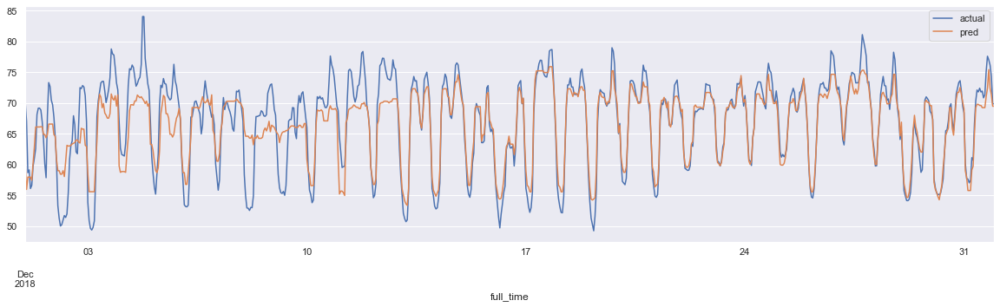

In [83]:
pred_df=pd.DataFrame({"actual":y_test,"pred":y_pred}).set_index(test_bar["full_time"])

pred_df[["actual","pred"]].plot(figsize=(20,5));

In [84]:
fig = go.Figure()
fig.add_trace(go.Scatter(y=pred_df.actual,
                   mode='lines',
                   name='test'))
fig.add_trace(go.Scatter(y=pred_df.pred,
                   mode='lines',
                   name='pred'))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(title='Prediction Result',
                  xaxis_title='Date',
                  yaxis_title='Production')
fig.show()

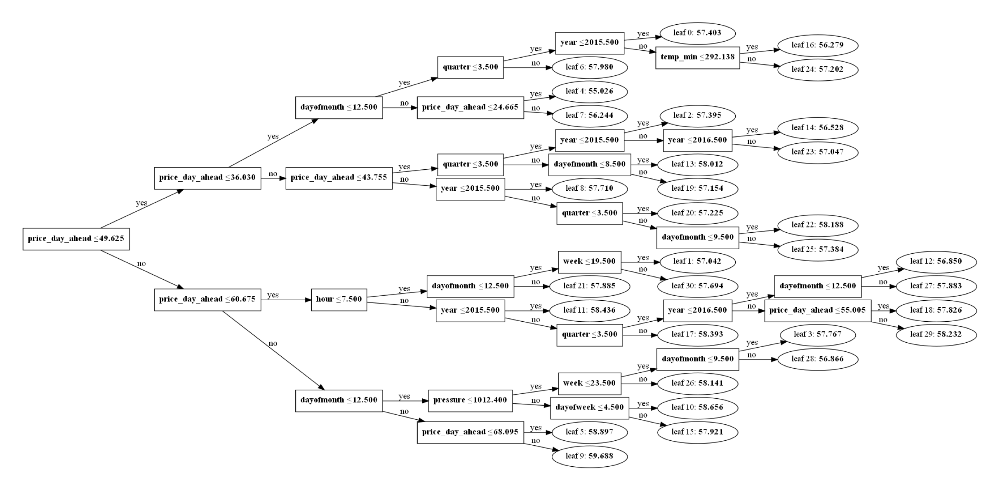

In [85]:
plot_tree(model,dpi=500,tree_index=0);

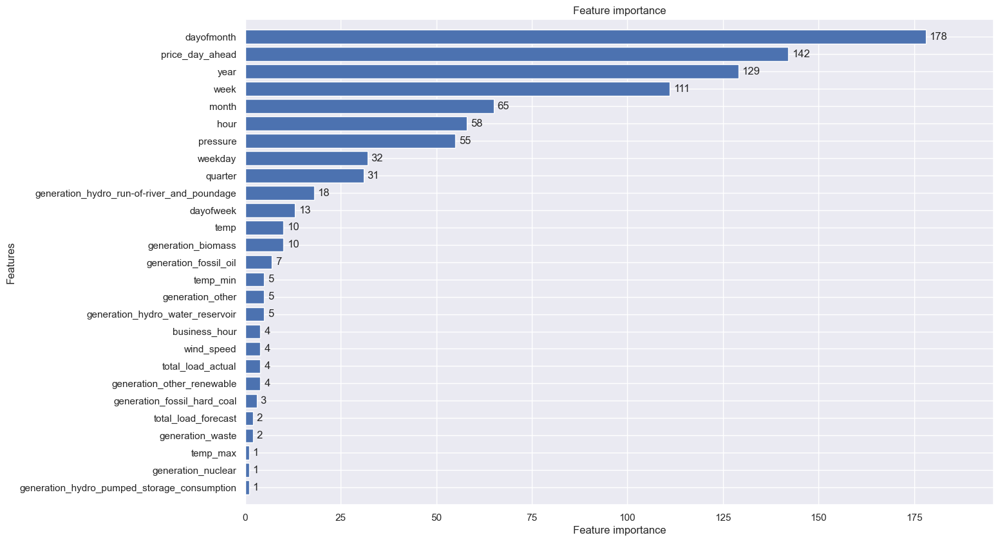

In [86]:
plot_importance(booster=model,
                height=0.8,
                figsize=(15,10),
                dpi=100);

In [95]:
model=LGBMRegressor(random_state=0,
                   num_iterations=21
                   ).fit(X_train_t,y_train)

perm = PermutationImportance(model, random_state=0).fit(X_test_t,y_test)
eli5.show_weights(perm, feature_names = X_test_t.columns.tolist(),top=20)

Weight,Feature
1.2293 ± 0.0911,price day ahead
0.3735 ± 0.0563,dayofmonth
0.1672 ± 0.0325,hour
0.0376 ± 0.0051,weekday
0.0270 ± 0.0033,dayofweek
0.0241 ± 0.0077,week
0.0072 ± 0.0015,total load actual
0.0060 ± 0.0032,business hour
0.0057 ± 0.0019,generation hydro water reservoir
0.0055 ± 0.0036,pressure


In [87]:
X_train_ind = X_train.reset_index()
X_test_ind = X_test.reset_index()

#### 交叉验证

In [ ]:
params = {
    'boosting_type':'gbdt',
    'objective': 'regression',
    'metric': ['mape','rmse'],
    
}

tscv=TimeSeriesSplit(n_splits=10)
full_df=pd.concat([X_train_t,y_train],axis=1)
X=full_df.drop(["price actual"],axis=1)
y=full_df["price actual"]
scores=[]

for train_index, test_index in tscv.split(X):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X.loc[train_index], X.loc[test_index]
    y_train, y_test = y.loc[train_index], y.loc[test_index]
    
    model=LGBMRegressor(random_state=0,metric=['rmse']) 
    train = lgb.Dataset(X_train,y_train)
    val = lgb.Dataset(X_test,y_test,reference=train)
    #print('Train and Validate')
    model = lgb.train(params=params,train_set=train,valid_sets=val,
                           num_boost_round=1000,verbose_eval=10,early_stopping_rounds=50)
    score=model.best_score.items()
    scores.append(score)
    
print("Best Scores: ",scores)

#### 特征选择

In [89]:
full_data=pd.concat([train_bar_new,test_bar_new])  
full_data

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,clouds_all,weather_main,weather_description,business hour,weekday,year,quarter,month,week,hour,dayofweek,dayofmonth,is_weekend
pd_time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17,6436,26118,25385.0,50.10,65.41,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,clear,sky is clear,1.0,0.0,2015,1,1,1,0,3,1,0
2015-01-01 00:00:00+00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16,5856,24934,24382.0,48.10,64.92,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,clear,sky is clear,0.0,0.0,2015,1,1,1,1,3,1,0
2015-01-01 01:00:00+00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8,5454,23515,22734.0,47.33,64.48,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,clear,sky is clear,0.0,0.0,2015,1,1,1,2,3,1,0
2015-01-01 02:00:00+00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2,5151,22642,21286.0,42.27,59.32,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,clear,sky is clear,0.0,0.0,2015,1,1,1,3,3,1,0
2015-01-01 03:00:00+00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9,4861,21785,20264.0,38.41,56.04,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,clear,sky is clear,0.0,0.0,2015,1,1,1,4,3,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 18:00:00+00:00,297.0,0.0,7634.0,2628.0,178.0,1.0,1135.0,4836.0,6073.0,63.0,95.0,85.0,277.0,3113.0,96,3253,30619,30653.0,68.85,77.02,284.130,282.150,286.150,1027.0,71,1.0,250,0.0,0,clear,sky is clear,2.0,0.0,2018,4,12,1,19,0,31,0
2018-12-31 19:00:00+00:00,296.0,0.0,7241.0,2566.0,174.0,1.0,1172.0,3931.0,6074.0,62.0,95.0,33.0,280.0,3288.0,51,3353,29932,29735.0,68.40,76.16,282.640,281.150,284.150,1027.0,62,3.0,270,0.0,0,clear,sky is clear,1.0,0.0,2018,4,12,1,20,0,31,0
2018-12-31 20:00:00+00:00,292.0,0.0,7025.0,2422.0,168.0,50.0,1148.0,2831.0,6076.0,61.0,94.0,31.0,286.0,3503.0,36,3404,27903,28071.0,66.88,74.30,282.140,280.150,284.150,1028.0,53,4.0,300,0.0,0,clear,sky is clear,1.0,0.0,2018,4,12,1,21,0,31,0


In [90]:
full_data.shape

(35064, 41)

In [99]:
#full_data["price(t-1)"]=full_data["price actual"].shift(1)
#full_data["price(t-2)"]=full_data["price actual"].shift(2)
#full_data["price(t-3)"]=full_data["price actual"].shift(3)
#full_data["price(t-4)"]=full_data["price actual"].shift(4)
#full_data["price(t-5)"]=full_data["price actual"].shift(5)
#full_data["price(t-6)"]=full_data["price actual"].shift(6)
#full_data["price(t-12)"]=full_data["price actual"].shift(12)

full_data["price(t-12)"]=full_data["price actual"].shift(12)
full_data["price(t-24)"]=full_data["price actual"].shift(36)
full_data["price(t-36)"]=full_data["price actual"].shift(48)
full_data["price(t-48)"]=full_data["price actual"].shift(48)
full_data["price(t-72)"]=full_data["price actual"].shift(72)
full_data["price(t-168)"]=full_data["price actual"].shift(168)

full_data["price(t-12)"].fillna(method="bfill",inplace=True)
full_data["price(t-36)"].fillna(method="bfill",inplace=True)
full_data["price(t-24)"].fillna(method="bfill",inplace=True)
full_data["price(t-48)"].fillna(method="bfill",inplace=True)
full_data["price(t-72)"].fillna(method="bfill",inplace=True)
full_data["price(t-168)"].fillna(method="bfill",inplace=True)

full_data["diff_forecast"]=full_data["total load actual"] - full_data["total load forecast"]

full_data["roll_price_4"]=full_data["price actual"].rolling(window=4).mean()
full_data["roll_price_6"]=full_data["price actual"].rolling(window=6).mean()
full_data["roll_price_12"]=full_data["price actual"].rolling(window=12).mean()
full_data["roll_price_24"]=full_data["price actual"].rolling(window=24).mean()
full_data["roll_price_48"]=full_data["price actual"].rolling(window=48).mean()

full_data["roll_price_24_min"]=full_data["price actual"].rolling(window=24).min()
full_data["roll_price_12_min"]=full_data["price actual"].rolling(window=12).min()
full_data["roll_price_24_max"]=full_data["price actual"].rolling(window=24).max()
full_data["roll_price_12_max"]=full_data["price actual"].rolling(window=12).max()

full_data["roll_price_4"].fillna(method="bfill",inplace=True)
full_data["roll_price_6"].fillna(method="bfill",inplace=True)
full_data["roll_price_12"].fillna(method="bfill",inplace=True)
full_data["roll_price_24"].fillna(method="bfill",inplace=True)
full_data["roll_price_48"].fillna(method="bfill",inplace=True)

full_data["roll_price_24_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_24_max"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_max"].fillna(method="bfill",inplace=True)

In [111]:
full_data

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,clouds_all,weather_main,weather_description,business hour,weekday,year,quarter,month,week,hour,dayofweek,dayofmonth,is_weekend,price(t-12),price(t-24),price(t-36),price(t-48),price(t-72),price(t-168),diff_forecast,roll_price_4,roll_price_6,roll_price_12,roll_price_24,roll_price_48,roll_price_24_min,roll_price_12_min,roll_price_24_max,roll_price_12_max
pd_time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17,6436,26118,25385.0,50.10,65.41,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,clear,sky is clear,1.0,0.0,2015,1,1,1,0,3,1,0,65.41,65.41,65.41,65.41,65.41,65.41,-733.0,63.5325,60.633333,57.411667,62.148750,65.737917,48.98,48.98,75.64,65.41
2015-01-01 00:00:00+00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16,5856,24934,24382.0,48.10,64.92,281.625,281.625,281.625,1035.0,100,7.0,58,0.0,0,clear,sky is clear,0.0,0.0,2015,1,1,1,1,3,1,0,65.41,65.41,65.41,65.41,65.41,65.41,-552.0,63.5325,60.633333,57.411667,62.148750,65.737917,48.98,48.98,75.64,65.41
2015-01-01 01:00:00+00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8,5454,23515,22734.0,47.33,64.48,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,clear,sky is clear,0.0,0.0,2015,1,1,1,2,3,1,0,65.41,65.41,65.41,65.41,65.41,65.41,-781.0,63.5325,60.633333,57.411667,62.148750,65.737917,48.98,48.98,75.64,65.41
2015-01-01 02:00:00+00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2,5151,22642,21286.0,42.27,59.32,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,clear,sky is clear,0.0,0.0,2015,1,1,1,3,3,1,0,65.41,65.41,65.41,65.41,65.41,65.41,-1356.0,63.5325,60.633333,57.411667,62.148750,65.737917,48.98,48.98,75.64,65.41
2015-01-01 03:00:00+00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9,4861,21785,20264.0,38.41,56.04,281.286,281.286,281.286,1036.0,100,7.0,48,0.0,0,clear,sky is clear,0.0,0.0,2015,1,1,1,4,3,1,0,65.41,65.41,65.41,65.41,65.41,65.41,-1521.0,61.1900,60.633333,57.411667,62.148750,65.737917,48.98,48.98,75.64,65.41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 18:00:00+00:00,297.0,0.0,7634.0,2628.0,178.0,1.0,1135.0,4836.0,6073.0,63.0,95.0,85.0,277.0,3113.0,96,3253,30619,30653.0,68.85,77.02,284.130,282.150,286.150,1027.0,71,1.0,250,0.0,0,clear,sky is clear,2.0,0.0,2018,4,12,1,19,0,31,0,60.70,56.35,71.01,71.01,77.10,75.30,34.0,75.2800,73.986667,72.420000,68.245833,66.168958,57.04,66.64,77.61,77.61
2018-12-31 19:00:00+00:00,296.0,0.0,7241.0,2566.0,174.0,1.0,1172.0,3931.0,6074.0,62.0,95.0,33.0,280.0,3288.0,51,3353,29932,29735.0,68.40,76.16,282.640,281.150,284.150,1027.0,62,3.0,270,0.0,0,clear,sky is clear,1.0,0.0,2018,4,12,1,20,0,31,0,66.64,57.70,70.72,70.72,73.60,74.95,-197.0,76.4800,74.688333,73.213333,68.362917,66.282292,57.04,70.33,77.61,77.61
2018-12-31 20:00:00+00:00,292.0,0.0,7025.0,2422.0,168.0,50.0,1148.0,2831.0,6076.0,61.0,94.0,31.0,286.0,3503.0,36,3404,27903,28071.0,66.88,74.30,282.140,280.150,284.150,1028.0,53,4.0,300,0.0,0,clear,sky is clear,1.0,0.0,2018,4,12,1,21,0,31,0,70.33,61.77,70.34,70.34,69.21,73.16,168.0,76.2725,75.263333,

#### 变量选择可以使用F检验过滤等等

In [100]:
train_full=full_data.iloc[:34320,:]
test_full=full_data.iloc[34320:,:]

X_train_full=train_full.drop(["price actual"],axis=1)
y_train=train_full["price actual"]

X_test_full=test_full.drop(["price actual"],axis=1)
y_test=test_full["price actual"]


encoder = OrdinalEncoder(encoding_method='arbitrary', variables=['weather_main',"weather_description"])
#encoder=OneHotEncoder(variables=['weather_main',"weather_description"])
encoder.fit(X_train_full, y_train)

X_train_full = encoder.transform(X_train_full)
X_test_full = encoder.transform(X_test_full)

In [101]:
F, pvalues_f = f_classif(X_train_full,y_train)
goodindex_f = np.argwhere(pvalues_f<0.01).flatten()
print(pvalues_f,goodindex_f)
print(X_train_full.iloc[:,goodindex_f].columns)

[3.38870207e-011 2.39436568e-203 0.00000000e+000 0.00000000e+000
 3.99983351e-116 0.00000000e+000 4.89463998e-030 9.82073662e-055
 6.80798756e-010 2.78627645e-019 1.65107265e-063 3.79381877e-002
 6.32567149e-030 7.32671940e-082 1.03909707e-002 1.51463489e-085
 0.00000000e+000 0.00000000e+000 0.00000000e+000 3.30704722e-008
 9.53466586e-009 3.22142094e-009 1.52983592e-082 5.36982017e-004
 6.58693638e-050 1.89719784e-002 9.93072077e-001 3.75493965e-001
 2.04663507e-001 1.61811207e-002 1.82596470e-063 3.46670659e-051
 4.16877605e-001 1.03260299e-142 8.94596330e-156 1.93104166e-164
 4.25404003e-071 1.11253384e-023 1.74471530e-003 2.77098594e-036
 0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
 0.00000000e+000 0.00000000e+000 5.08695929e-002 0.00000000e+000
 0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
 0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000] [ 0  1  2  3  4  5  6  7  8  9 10 12 13 15 16 17 18 19 20 21 22 23 24 30
 31 33 34 35 36 

In [102]:
columns_to_use=["generation biomass",
                "generation fossil brown coal/lignite",
                "generation fossil gas",
               "generation fossil hard coal",
                "generation fossil oil",
                "generation hydro pumped storage consumption",
                "generation hydro run-of-river and poundage",
                "generation hydro water reservoir","generation nuclear",
                "generation other renewable",
                "generation waste",
                "forecast solar day ahead",
                "price day ahead",
                "forecast wind onshore day ahead",
                "total load actual",
                "temp_min",
                "pressure",
                "humidity",
                "wind_speed",
                "wind_deg",
                "rain_1h",
                "clouds_all",
                "weather_main",
                "weather_description",
                "hour",
                "dayofweek",
                "dayofmonth",
                "is_weekend",
                "price(t-12)",
                'price(t-168)',
                'diff_forecast',
                "week",
                "roll_price_24_min",
                "price(t-72)",
                'roll_price_6',
                'business hour',
                'weekday',
                "price actual"
               ]

columns_to_use2=["generation biomass",
                "generation fossil brown coal/lignite",
                "generation fossil gas",
               "generation fossil hard coal",
                "generation fossil oil",
                "generation hydro pumped storage consumption",
                "generation hydro run-of-river and poundage",
                "generation hydro water reservoir","generation nuclear",
                "generation other renewable",
                "generation waste",
                "forecast solar day ahead",
                "price day ahead",
                "forecast wind onshore day ahead",
                "total load actual",
                "temp_min",
                "pressure",
                "humidity",
                "wind_speed",
                "wind_deg",
                "rain_1h",
                "snow_3h",
                "clouds_all",
                "weather_main",
                "weather_description",
                "hour",
                "dayofweek",
                "dayofmonth",
                "is_weekend",
                "price(t-12)",
                  'price(t-168)',
                'diff_forecast',
                "week",
                "roll_price_24_min",
                "price(t-72)",
                'roll_price_6',
                'business hour',
                'weekday',
                "price actual"
               ]

In [103]:
train_=full_data[columns_to_use].iloc[:34320,:]
test_=full_data[columns_to_use].iloc[34320:,:]

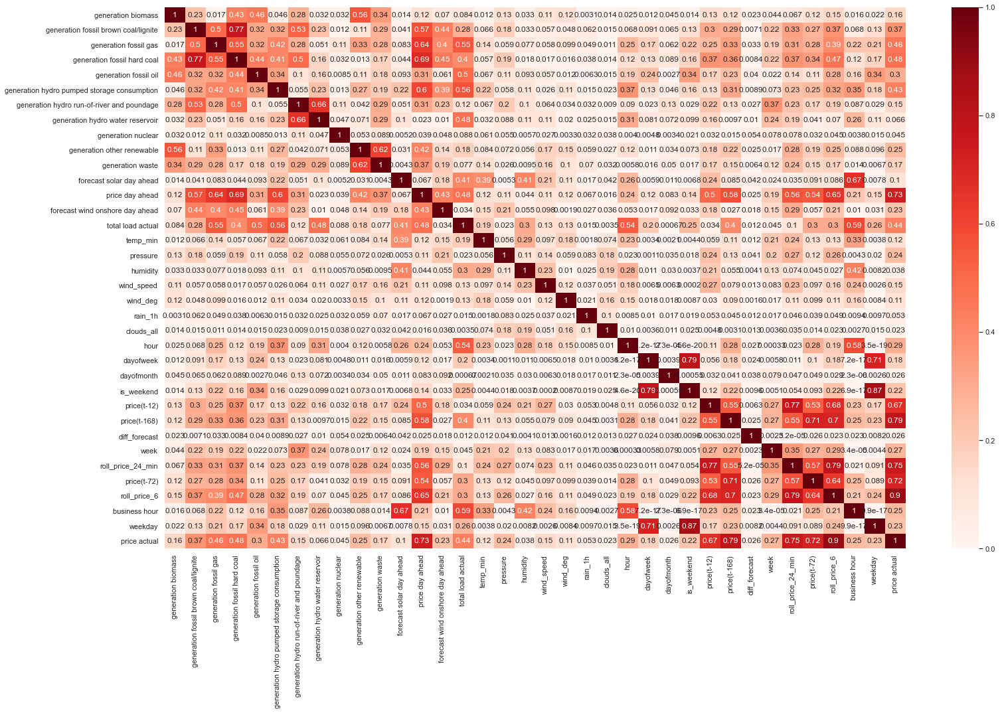

In [104]:
plt.figure(figsize=(25,15));
plt.xticks(rotation=45)
sns.heatmap(train_.corr().abs(),annot=True,cmap="Reds");

In [105]:
X_train=train_.drop(["price actual"],axis=1)
y_train=train_["price actual"]

X_test=test_.drop(["price actual"],axis=1)
y_test=test_["price actual"]


encoder = OrdinalEncoder(encoding_method='arbitrary', variables=['weather_main',"weather_description"])
#encoder=OneHotEncoder(variables=['weather_main',"weather_description"])
encoder.fit(X_train, y_train)

X_train = encoder.transform(X_train)
X_test = encoder.transform(X_test)

In [119]:
params = {
    'boosting_type':'gbdt',#gbdt
    'objective': 'regression',
    'metric': ['mape','rmse'],
    "num_iterations":100,#26
    "feature_fraction":0.9,
    'learning_rate ': 0.01,
    "reg_lambda":300,
    "bagging_fraction":0.8,
    }
full_train=lgb.Dataset(X_train,y_train)
model=lgb.train(params,full_train,num_boost_round=10,verbose_eval=10)

pred_train=model.predict(X_train)
pred_test=model.predict(X_test)

display(result_df(pred_train,y_train))

display(result_df(pred_test,y_test))

[LightGBM] [Warning] Unknown parameter: 0.01
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Unknown parameter: 0.01
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6027
[LightGBM] [Info] Number of data points in the train set: 34320, number of used features: 37
[LightGBM] [Info] Start training from score 57.685480


,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.968545,6.043262,2.458305,1.730847,3.301303,3.00105


,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.916064,4.34561,2.084613,1.580066,2.355859,2.331663


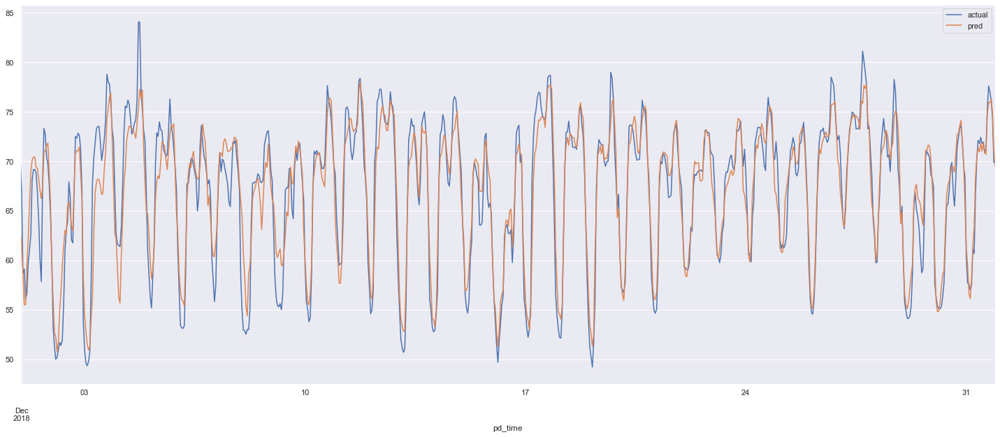

In [107]:
pred_df=pd.DataFrame({"actual":y_test,"pred":pred_test})

pred_df[["actual","pred"]].plot(figsize=(25,10));

#### 绘制真实值与预测值的对比

In [120]:
fig = go.Figure()
fig.add_trace(go.Scatter(y=pred_df.actual,
                   mode='lines',
                   name='test'))
fig.add_trace(go.Scatter(y=pred_df.pred,
                   mode='lines',
                   name='pred'))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(title='Prediction Result',
                  xaxis_title='Date',
                  yaxis_title='Production')
fig.show()

#### 绘制特征重要性图像

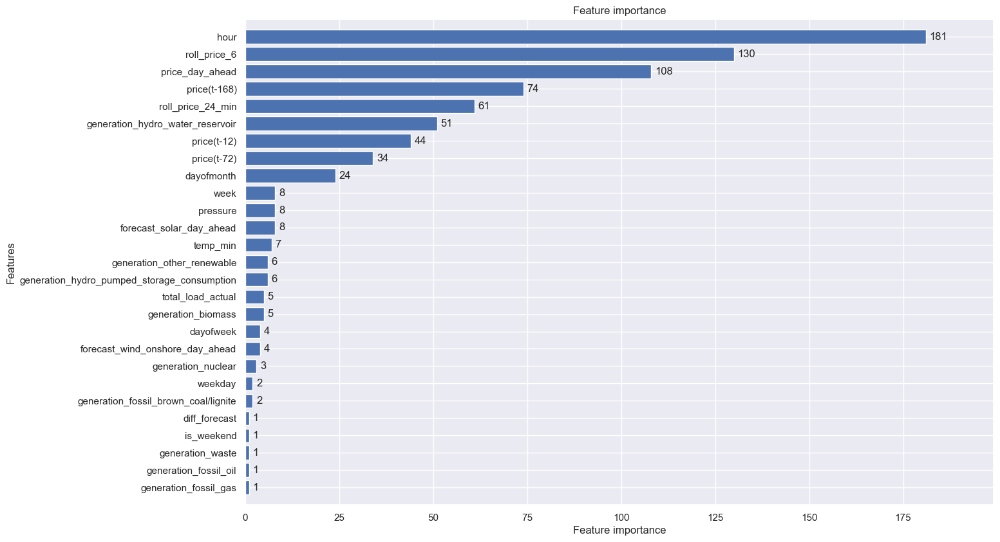

In [109]:
plot_importance(booster=model,
                height=0.8,
                figsize=(15,10),
                dpi=100);

#### 绘制树模型的结构

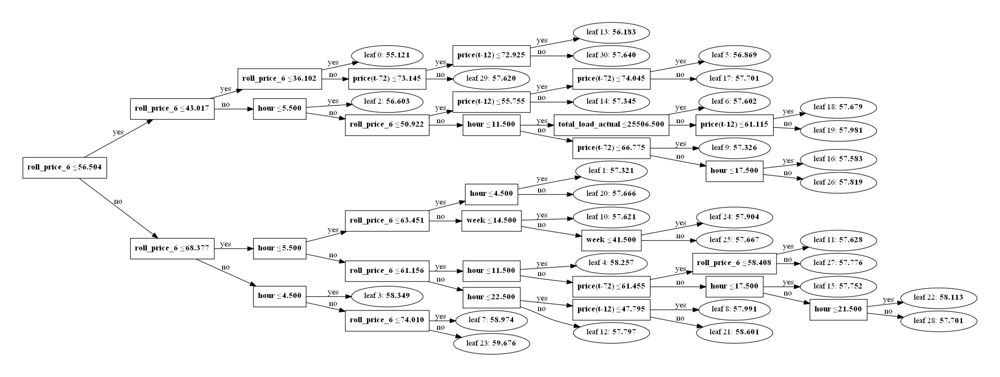

In [121]:
plot_tree(model,dpi=500,tree_index=0);

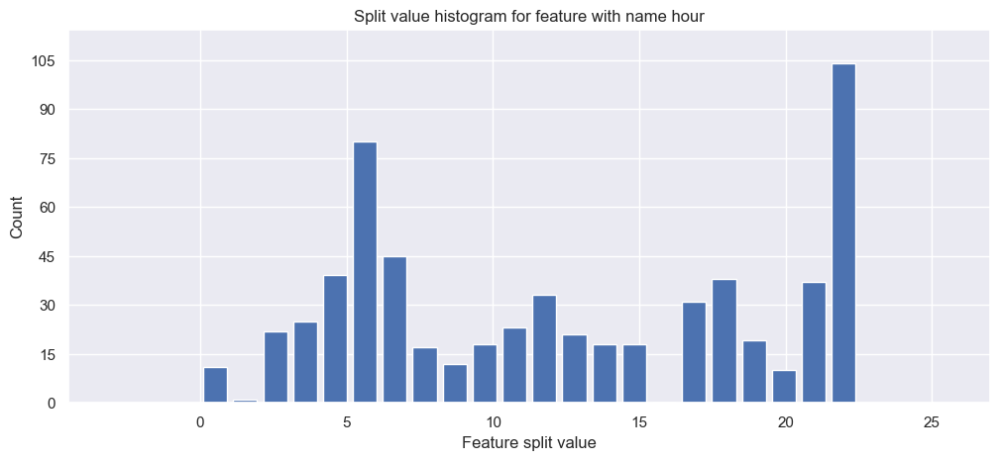

In [122]:
lgb.plot_split_value_histogram(model,feature="hour",figsize=(12,5),dpi=100);

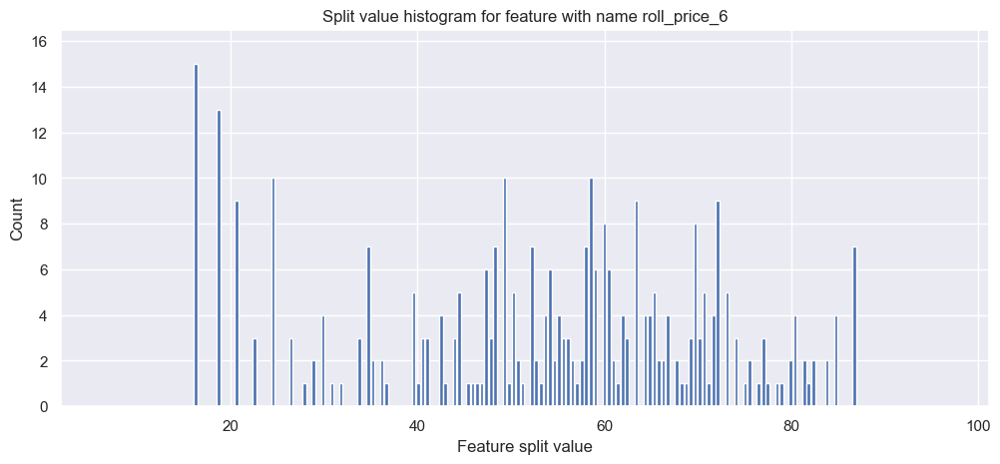

In [123]:
lgb.plot_split_value_histogram(model,feature="roll_price_6",figsize=(12,5),dpi=100);

#### 利用SHAP包进行解释性分析

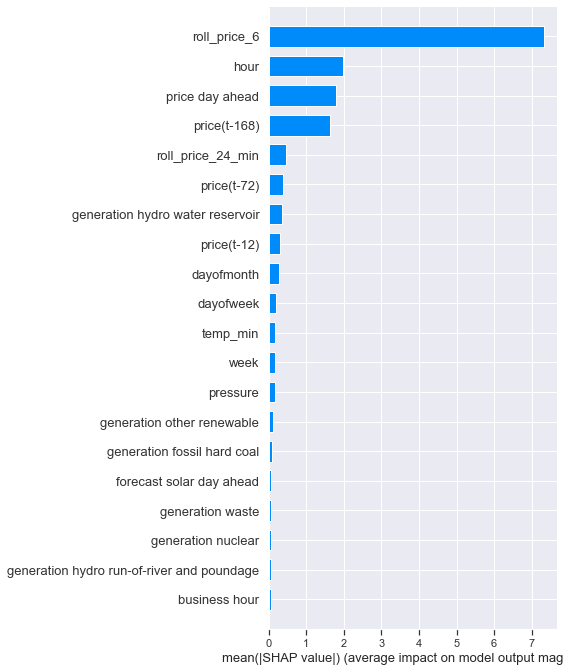

In [124]:
shap.initjs()
explainer = shap.TreeExplainer(model)

shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test, plot_type="bar")

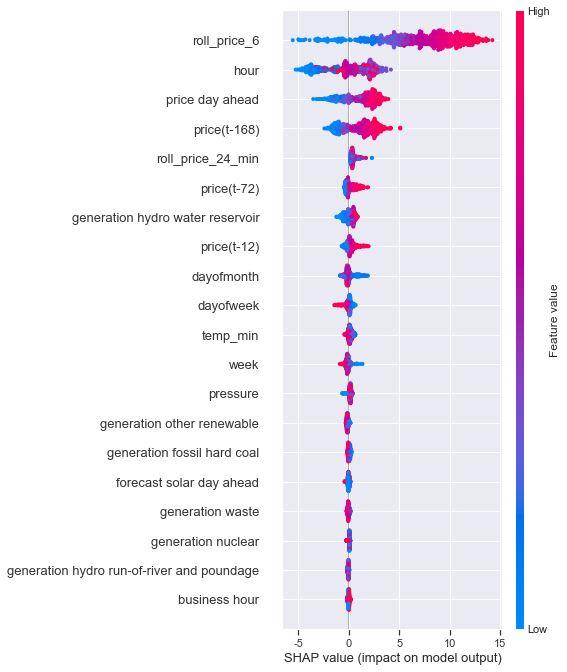

In [125]:
shap.summary_plot(shap_values, X_test)

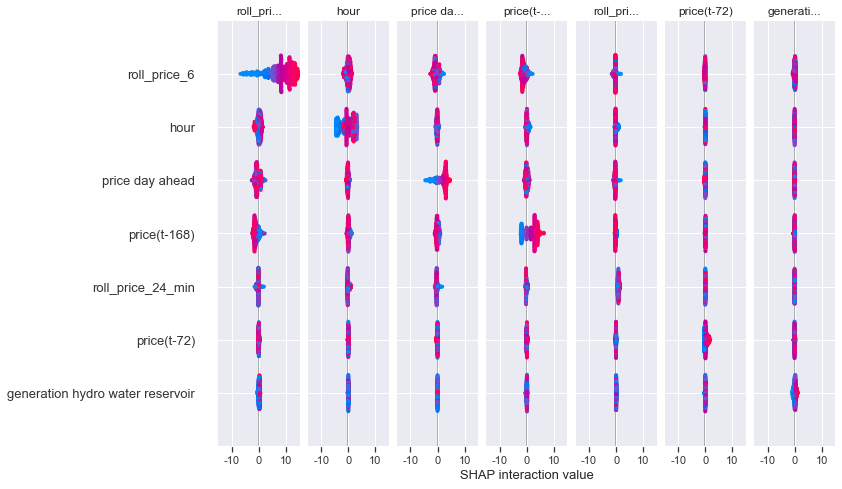

In [126]:
shap_interaction_values = explainer.shap_interaction_values(X_test)
shap.summary_plot(shap_interaction_values, X_test)

#### 单个特征的贡献分析（dependence_plot）

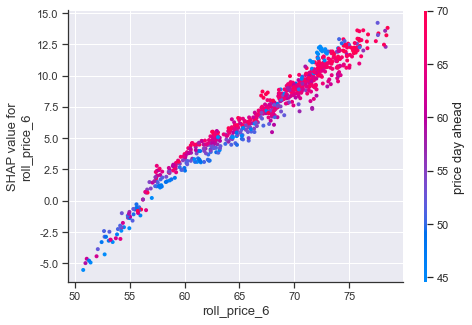

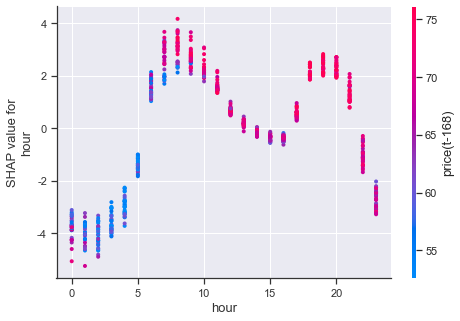

In [127]:
shap.dependence_plot("roll_price_6", shap_values, X_test)
shap.dependence_plot("hour", shap_values, X_test)

In [131]:
shap.force_plot(explainer.expected_value, shap_values, X_test)

#### 对于其他的数据集也采用相同的方式进行建模

In [128]:
X_train=train_bil_new.drop(["price actual"],axis=1)
y_train=train_bil_new["price actual"]

X_test=test_bil_new.drop(["price actual"],axis=1)
y_test=test_bil_new["price actual"]

encoder = OrdinalEncoder(encoding_method='ordered', variables=['weather_main',"weather_description"])
encoder.fit(X_train, y_train)

X_train_t = encoder.transform(X_train)
X_test_t = encoder.transform(X_test)
encoder.encoder_dict_

{'weather_main': {'haze': 0,
  'snow': 1,
  'rain': 2,
  'clouds': 3,
  'mist': 4,
  'thunderstorm': 5,
  'clear': 6,
  'drizzle': 7,
  'fog': 8},
 'weather_description': {'light shower snow': 0,
  'proximity moderate rain': 1,
  'haze': 2,
  'heavy intensity shower rain': 3,
  'rain and snow': 4,
  'heavy intensity drizzle': 5,
  'proximity shower rain': 6,
  'overcast clouds': 7,
  'light rain and snow': 8,
  'heavy intensity rain': 9,
  'shower rain': 10,
  'moderate rain': 11,
  'light rain': 12,
  'snow': 13,
  'thunderstorm with light rain': 14,
  'light snow': 15,
  'light intensity shower rain': 16,
  'scattered clouds': 17,
  'broken clouds': 18,
  'few clouds': 19,
  'mist': 20,
  'thunderstorm with rain': 21,
  'light intensity drizzle': 22,
  'drizzle': 23,
  'rain and drizzle': 24,
  'sky is clear': 25,
  'thunderstorm': 26,
  'proximity thunderstorm': 27,
  'fog': 28,
  'thunderstorm with heavy rain': 29,
  'light intensity drizzle rain': 30,
  'ragged shower rain': 31}}

In [129]:
full_data=pd.concat([train_bil_new,test_bil_new])  

#full_data["price(t-1)"]=full_data["price actual"].shift(1)
#full_data["price(t-2)"]=full_data["price actual"].shift(2)
#full_data["price(t-3)"]=full_data["price actual"].shift(3)
#full_data["price(t-4)"]=full_data["price actual"].shift(4)
#full_data["price(t-5)"]=full_data["price actual"].shift(5)
#full_data["price(t-6)"]=full_data["price actual"].shift(6)
#full_data["price(t-12)"]=full_data["price actual"].shift(12)

full_data["price(t-12)"]=full_data["price actual"].shift(12)
full_data["price(t-24)"]=full_data["price actual"].shift(36)
full_data["price(t-36)"]=full_data["price actual"].shift(48)
full_data["price(t-48)"]=full_data["price actual"].shift(48)
full_data["price(t-72)"]=full_data["price actual"].shift(72)
full_data["price(t-168)"]=full_data["price actual"].shift(168)

full_data["price(t-12)"].fillna(method="bfill",inplace=True)
full_data["price(t-36)"].fillna(method="bfill",inplace=True)
full_data["price(t-24)"].fillna(method="bfill",inplace=True)
full_data["price(t-48)"].fillna(method="bfill",inplace=True)
full_data["price(t-72)"].fillna(method="bfill",inplace=True)
full_data["price(t-168)"].fillna(method="bfill",inplace=True)

full_data["diff_forecast"]=full_data["total load actual"] - full_data["total load forecast"]

full_data["roll_price_4"]=full_data["price actual"].rolling(window=4).mean()
full_data["roll_price_6"]=full_data["price actual"].rolling(window=6).mean()
full_data["roll_price_12"]=full_data["price actual"].rolling(window=12).mean()
full_data["roll_price_24"]=full_data["price actual"].rolling(window=24).mean()
full_data["roll_price_48"]=full_data["price actual"].rolling(window=48).mean()

full_data["roll_price_24_min"]=full_data["price actual"].rolling(window=24).min()
full_data["roll_price_12_min"]=full_data["price actual"].rolling(window=12).min()
full_data["roll_price_24_max"]=full_data["price actual"].rolling(window=24).max()
full_data["roll_price_12_max"]=full_data["price actual"].rolling(window=12).max()

full_data["roll_price_4"].fillna(method="bfill",inplace=True)
full_data["roll_price_6"].fillna(method="bfill",inplace=True)
full_data["roll_price_12"].fillna(method="bfill",inplace=True)
full_data["roll_price_24"].fillna(method="bfill",inplace=True)
full_data["roll_price_48"].fillna(method="bfill",inplace=True)

full_data["roll_price_24_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_24_max"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_max"].fillna(method="bfill",inplace=True)

train_=full_data[columns_to_use2].iloc[:34320,:]
test_=full_data[columns_to_use2].iloc[34320:,:]

In [130]:
X_train=train_.drop(["price actual"],axis=1)
y_train=train_["price actual"]

X_test=test_.drop(["price actual"],axis=1)
y_test=test_["price actual"]


encoder = OrdinalEncoder(encoding_method='arbitrary', variables=['weather_main',"weather_description"])
#encoder=OneHotEncoder(variables=['weather_main',"weather_description"])
encoder.fit(X_train, y_train)

X_train = encoder.transform(X_train)
X_test = encoder.transform(X_test)

In [131]:
params = {
    'boosting_type':'gbdt',#gbdt
    'objective': 'regression',
    'metric': ['mape','rmse'],
    "num_iterations":100,#26
    "feature_fraction":0.9,
    "reg_lambda":300,
    "bagging_fraction":0.8,
    }
full_train=lgb.Dataset(X_train,y_train)
model=lgb.train(params,full_train,num_boost_round=10,verbose_eval=10)

pred_train=model.predict(X_train)
pred_test=model.predict(X_test)

display(result_df(pred_train,y_train))

display(result_df(pred_test,y_test))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6091
[LightGBM] [Info] Number of data points in the train set: 34320, number of used features: 38
[LightGBM] [Info] Start training from score 57.685480


,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.967746,6.194955,2.488967,1.770211,3.376038,3.069037


,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.917344,4.332873,2.081555,1.577404,2.348055,2.332504


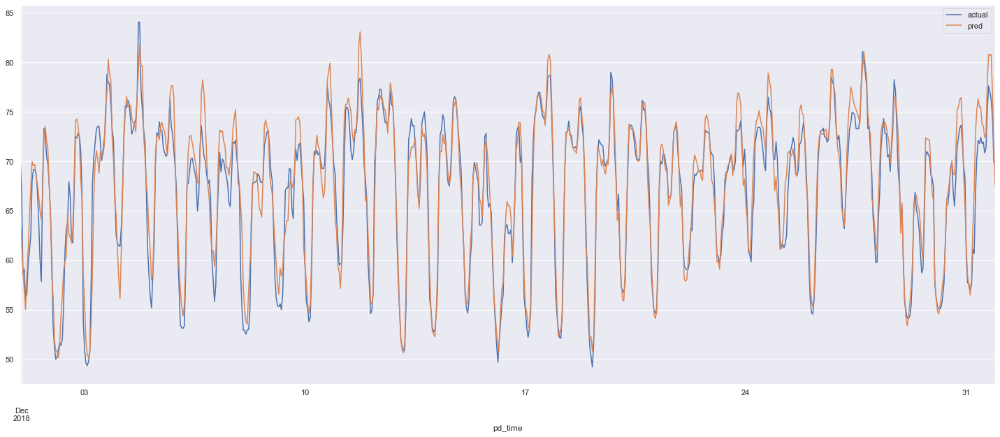

In [132]:
pred_df=pd.DataFrame({"actual":y_test,"pred":pred_test})

pred_df[["actual","pred"]].plot(figsize=(25,10));

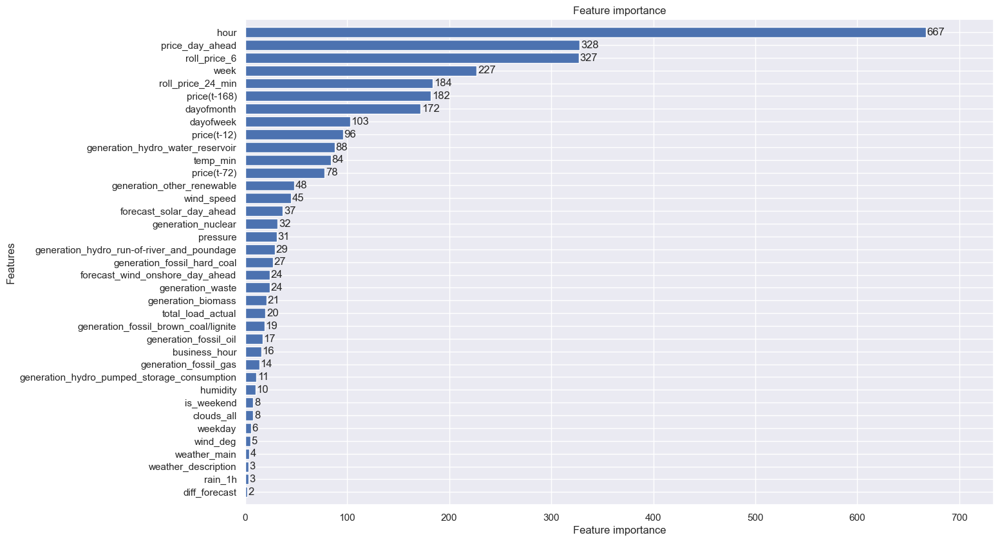

In [133]:
plot_importance(booster=model,
                height=0.8,
                figsize=(15,10),
                dpi=100);

In [135]:
full_data=pd.concat([train_mad_new,test_mad_new])  

#full_data["price(t-1)"]=full_data["price actual"].shift(1)
#full_data["price(t-2)"]=full_data["price actual"].shift(2)
#full_data["price(t-3)"]=full_data["price actual"].shift(3)
#full_data["price(t-4)"]=full_data["price actual"].shift(4)
#full_data["price(t-5)"]=full_data["price actual"].shift(5)
#full_data["price(t-6)"]=full_data["price actual"].shift(6)
#full_data["price(t-12)"]=full_data["price actual"].shift(12)

full_data["price(t-12)"]=full_data["price actual"].shift(12)
full_data["price(t-24)"]=full_data["price actual"].shift(36)
full_data["price(t-36)"]=full_data["price actual"].shift(48)
full_data["price(t-48)"]=full_data["price actual"].shift(48)
full_data["price(t-72)"]=full_data["price actual"].shift(72)
full_data["price(t-168)"]=full_data["price actual"].shift(168)

full_data["price(t-12)"].fillna(method="bfill",inplace=True)
full_data["price(t-36)"].fillna(method="bfill",inplace=True)
full_data["price(t-24)"].fillna(method="bfill",inplace=True)
full_data["price(t-48)"].fillna(method="bfill",inplace=True)
full_data["price(t-72)"].fillna(method="bfill",inplace=True)
full_data["price(t-168)"].fillna(method="bfill",inplace=True)

full_data["diff_forecast"]=full_data["total load actual"] - full_data["total load forecast"]

full_data["roll_price_4"]=full_data["price actual"].rolling(window=4).mean()
full_data["roll_price_6"]=full_data["price actual"].rolling(window=6).mean()
full_data["roll_price_12"]=full_data["price actual"].rolling(window=12).mean()
full_data["roll_price_24"]=full_data["price actual"].rolling(window=24).mean()
full_data["roll_price_48"]=full_data["price actual"].rolling(window=48).mean()

full_data["roll_price_24_min"]=full_data["price actual"].rolling(window=24).min()
full_data["roll_price_12_min"]=full_data["price actual"].rolling(window=12).min()
full_data["roll_price_24_max"]=full_data["price actual"].rolling(window=24).max()
full_data["roll_price_12_max"]=full_data["price actual"].rolling(window=12).max()

full_data["roll_price_4"].fillna(method="bfill",inplace=True)
full_data["roll_price_6"].fillna(method="bfill",inplace=True)
full_data["roll_price_12"].fillna(method="bfill",inplace=True)
full_data["roll_price_24"].fillna(method="bfill",inplace=True)
full_data["roll_price_48"].fillna(method="bfill",inplace=True)

full_data["roll_price_24_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_24_max"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_max"].fillna(method="bfill",inplace=True)

train_=full_data[columns_to_use2].iloc[:34320,:]
test_=full_data[columns_to_use2].iloc[34320:,:]

X_train=train_.drop(["price actual"],axis=1)
y_train=train_["price actual"]

X_test=test_.drop(["price actual"],axis=1)
y_test=test_["price actual"]


encoder = OrdinalEncoder(encoding_method='arbitrary', variables=['weather_main',"weather_description"])
#encoder=OneHotEncoder(variables=['weather_main',"weather_description"])
encoder.fit(X_train, y_train)

X_train = encoder.transform(X_train)
X_test = encoder.transform(X_test)

params = {
    'boosting_type':'gbdt',#gbdt
    'objective': 'regression',
    'metric': ['mape','rmse'],
    "num_iterations":100,#26
    "feature_fraction":0.9,
    "reg_lambda":300,
    "bagging_fraction":0.8,
    }
full_train=lgb.Dataset(X_train,y_train)
model=lgb.train(params,full_train,num_boost_round=10,verbose_eval=10)

pred_train=model.predict(X_train)
pred_test=model.predict(X_test)

display(result_df(pred_train,y_train))

display(result_df(pred_test,y_test))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6089
[LightGBM] [Info] Number of data points in the train set: 34320, number of used features: 37
[LightGBM] [Info] Start training from score 57.685480


,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.968205,6.111148,2.472074,1.742748,3.326469,3.021469


,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.917735,4.17825,2.044077,1.527509,2.285645,2.262161


In [136]:
full_data=pd.concat([train_sev_new,test_sev_new])  

#full_data["price(t-1)"]=full_data["price actual"].shift(1)
#full_data["price(t-2)"]=full_data["price actual"].shift(2)
#full_data["price(t-3)"]=full_data["price actual"].shift(3)
#full_data["price(t-4)"]=full_data["price actual"].shift(4)
#full_data["price(t-5)"]=full_data["price actual"].shift(5)
#full_data["price(t-6)"]=full_data["price actual"].shift(6)
#full_data["price(t-12)"]=full_data["price actual"].shift(12)

full_data["price(t-12)"]=full_data["price actual"].shift(12)
full_data["price(t-24)"]=full_data["price actual"].shift(36)
full_data["price(t-36)"]=full_data["price actual"].shift(48)
full_data["price(t-48)"]=full_data["price actual"].shift(48)
full_data["price(t-72)"]=full_data["price actual"].shift(72)
full_data["price(t-168)"]=full_data["price actual"].shift(168)

full_data["price(t-12)"].fillna(method="bfill",inplace=True)
full_data["price(t-36)"].fillna(method="bfill",inplace=True)
full_data["price(t-24)"].fillna(method="bfill",inplace=True)
full_data["price(t-48)"].fillna(method="bfill",inplace=True)
full_data["price(t-72)"].fillna(method="bfill",inplace=True)
full_data["price(t-168)"].fillna(method="bfill",inplace=True)

full_data["diff_forecast"]=full_data["total load actual"] - full_data["total load forecast"]

full_data["roll_price_4"]=full_data["price actual"].rolling(window=4).mean()
full_data["roll_price_6"]=full_data["price actual"].rolling(window=6).mean()
full_data["roll_price_12"]=full_data["price actual"].rolling(window=12).mean()
full_data["roll_price_24"]=full_data["price actual"].rolling(window=24).mean()
full_data["roll_price_48"]=full_data["price actual"].rolling(window=48).mean()

full_data["roll_price_24_min"]=full_data["price actual"].rolling(window=24).min()
full_data["roll_price_12_min"]=full_data["price actual"].rolling(window=12).min()
full_data["roll_price_24_max"]=full_data["price actual"].rolling(window=24).max()
full_data["roll_price_12_max"]=full_data["price actual"].rolling(window=12).max()

full_data["roll_price_4"].fillna(method="bfill",inplace=True)
full_data["roll_price_6"].fillna(method="bfill",inplace=True)
full_data["roll_price_12"].fillna(method="bfill",inplace=True)
full_data["roll_price_24"].fillna(method="bfill",inplace=True)
full_data["roll_price_48"].fillna(method="bfill",inplace=True)

full_data["roll_price_24_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_24_max"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_max"].fillna(method="bfill",inplace=True)

train_=full_data[columns_to_use].iloc[:34320,:]
test_=full_data[columns_to_use].iloc[34320:,:]

X_train=train_.drop(["price actual"],axis=1)
y_train=train_["price actual"]

X_test=test_.drop(["price actual"],axis=1)
y_test=test_["price actual"]


encoder = OrdinalEncoder(encoding_method='arbitrary', variables=['weather_main',"weather_description"])
#encoder=OneHotEncoder(variables=['weather_main',"weather_description"])
encoder.fit(X_train, y_train)

X_train = encoder.transform(X_train)
X_test = encoder.transform(X_test)

params = {
    'boosting_type':'gbdt',#gbdt
    'objective': 'regression',
    'metric': ['mape','rmse'],
    "num_iterations":100,#26
    "feature_fraction":0.9,
    "reg_lambda":300,
    "bagging_fraction":0.8,
    }
full_train=lgb.Dataset(X_train,y_train)
model=lgb.train(params,full_train,num_boost_round=10,verbose_eval=10)

pred_train=model.predict(X_train)
pred_test=model.predict(X_test)

display(result_df(pred_train,y_train))

display(result_df(pred_test,y_test))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6033
[LightGBM] [Info] Number of data points in the train set: 34320, number of used features: 37
[LightGBM] [Info] Start training from score 57.685480


,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.967935,6.151202,2.480162,1.752805,3.344686,3.039002


,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.920421,4.100288,2.024917,1.523573,2.279569,2.252255


In [137]:
full_data=pd.concat([train_val_new,test_val_new])  

#full_data["price(t-1)"]=full_data["price actual"].shift(1)
#full_data["price(t-2)"]=full_data["price actual"].shift(2)
#full_data["price(t-3)"]=full_data["price actual"].shift(3)
#full_data["price(t-4)"]=full_data["price actual"].shift(4)
#full_data["price(t-5)"]=full_data["price actual"].shift(5)
#full_data["price(t-6)"]=full_data["price actual"].shift(6)
#full_data["price(t-12)"]=full_data["price actual"].shift(12)

full_data["price(t-12)"]=full_data["price actual"].shift(12)
full_data["price(t-24)"]=full_data["price actual"].shift(36)
full_data["price(t-36)"]=full_data["price actual"].shift(48)
full_data["price(t-48)"]=full_data["price actual"].shift(48)
full_data["price(t-72)"]=full_data["price actual"].shift(72)
full_data["price(t-168)"]=full_data["price actual"].shift(168)

full_data["price(t-12)"].fillna(method="bfill",inplace=True)
full_data["price(t-36)"].fillna(method="bfill",inplace=True)
full_data["price(t-24)"].fillna(method="bfill",inplace=True)
full_data["price(t-48)"].fillna(method="bfill",inplace=True)
full_data["price(t-72)"].fillna(method="bfill",inplace=True)
full_data["price(t-168)"].fillna(method="bfill",inplace=True)

full_data["diff_forecast"]=full_data["total load actual"] - full_data["total load forecast"]

full_data["roll_price_4"]=full_data["price actual"].rolling(window=4).mean()
full_data["roll_price_6"]=full_data["price actual"].rolling(window=6).mean()
full_data["roll_price_12"]=full_data["price actual"].rolling(window=12).mean()
full_data["roll_price_24"]=full_data["price actual"].rolling(window=24).mean()
full_data["roll_price_48"]=full_data["price actual"].rolling(window=48).mean()

full_data["roll_price_24_min"]=full_data["price actual"].rolling(window=24).min()
full_data["roll_price_12_min"]=full_data["price actual"].rolling(window=12).min()
full_data["roll_price_24_max"]=full_data["price actual"].rolling(window=24).max()
full_data["roll_price_12_max"]=full_data["price actual"].rolling(window=12).max()

full_data["roll_price_4"].fillna(method="bfill",inplace=True)
full_data["roll_price_6"].fillna(method="bfill",inplace=True)
full_data["roll_price_12"].fillna(method="bfill",inplace=True)
full_data["roll_price_24"].fillna(method="bfill",inplace=True)
full_data["roll_price_48"].fillna(method="bfill",inplace=True)

full_data["roll_price_24_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_24_max"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_max"].fillna(method="bfill",inplace=True)

train_=full_data[columns_to_use].iloc[:34320,:]
test_=full_data[columns_to_use].iloc[34320:,:]

X_train=train_.drop(["price actual"],axis=1)
y_train=train_["price actual"]

X_test=test_.drop(["price actual"],axis=1)
y_test=test_["price actual"]


encoder = OrdinalEncoder(encoding_method='arbitrary', variables=['weather_main',"weather_description"])
#encoder=OneHotEncoder(variables=['weather_main',"weather_description"])
encoder.fit(X_train, y_train)

X_train = encoder.transform(X_train)
X_test = encoder.transform(X_test)

params = {
    'boosting_type':'gbdt',#gbdt
    'objective': 'regression',
    'metric': ['mape','rmse'],
    "num_iterations":100,#26
    "feature_fraction":0.9,
    "reg_lambda":300,
    "bagging_fraction":0.8,
    }
full_train=lgb.Dataset(X_train,y_train)
model=lgb.train(params,full_train,num_boost_round=10,verbose_eval=10)

pred_train=model.predict(X_train)
pred_test=model.predict(X_test)

display(result_df(pred_train,y_train))

display(result_df(pred_test,y_test))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6140
[LightGBM] [Info] Number of data points in the train set: 34320, number of used features: 37
[LightGBM] [Info] Start training from score 57.685480


,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.968093,6.130543,2.475993,1.746547,3.336919,3.028056


,r2,MSE,RMSE,MAE,MAPE,WMAPE
0,0.909223,4.886081,2.210448,1.664398,2.467899,2.455333
